In [1]:
#jupyter nbconvert --to script Benchmark_clustering_noniid.ipynb
#python -m torch.utils.bottleneck Benchmark_clustering_noniid.py

In [2]:
import pandas as pd
import torch
from utils.utils_dataset import prepare_non_iid_federated_dataset_for_clustering, prepare_iid_federated_dataset_for_clustering
import os
from utils.utils_train import train_supervised, train_models_in_threads
from utils.utils_plots import plot_first_feature_combinations,  plot_first_feature_combinations, plot_results_metrics
import torch
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score, adjusted_rand_score, normalized_mutual_info_score
from collections import Counter

import matplotlib.pyplot as plt
import numpy as np


In [3]:
from model.eFedG import eFedG
from model.clustering_operations import ClusteringOps
from model.removal_mechanism import RemovalMechanism 
from model.merging_mechanism import MergingMechanism
from model.math_operations import MathOps
from model.consequence_operations import ConsequenceOps
from model.model_operations import ModelOps
from model.federated_operations import FederalOps

#This is needed for debugging
print("PyTorch Version:", torch.__version__)
print("CUDA Version:", torch.version.cuda)
torch.set_num_threads(os.cpu_count())

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#device = torch.device("cpu")

PyTorch Version: 2.1.2
CUDA Version: 11.8


In [4]:

def determine_cluster_labels(y_true, cluster_assignments):
    cluster_labels = {}
    for cluster in np.unique(cluster_assignments):
        cluster_indices = cluster_assignments == cluster
        most_common_label = Counter(y_true[cluster_indices]).most_common(1)[0][0]
        cluster_labels[cluster] = most_common_label
    return cluster_labels

def remap_assignments(assignments, cluster_labels):
    remapped_labels = np.array([cluster_labels[cluster] for cluster in assignments])
    return remapped_labels

In [5]:
import time
import torch

def run_federated_simulation(rounds, num_clients, local_model_params, federated_model_params, train_loaders, train_dataset, debug_flag, profiler_flag, name=None, flag_axis = True):
    import cProfile
    if profiler_flag:
        pr = cProfile.Profile()
        pr.enable()

    start_time = time.time()  # Start time
    federated_model = eFedG(**federated_model_params)
    all_federated_clusters = []
    local_models = [eFedG(**local_model_params) for _ in range(num_clients)]
    
    for round in range(rounds):

        if len(local_models) > 1:
            local_models = train_models_in_threads(local_models, train_loaders, round = 0, debug_flag= debug_flag)
        else:
            local_models = train_supervised(local_models[0], train_loaders[0], index=1, round=round, debug_flag=debug_flag)
            local_models = [local_models]
        
        print('Local learning done, transmitting')
        federated_model.__init__(**federated_model_params)
        federated_model.set_debugging_flag(debug_flag)
        
        for client_model in local_models:
            federated_model.federal_agent.merge_model_privately(client_model, federated_model.kappa_n, 0)
        federated_model.federal_agent.federated_merging()
        #federated_model.federal_agent.remove_irrelevant_clusters()
        
        if debug_flag in (1, 8):
            
            fig = plot_first_feature_combinations((X, y), model=federated_model, num_sigma=2, N_max=federated_model.kappa_n, flag_unlabeled=(debug_flag == 8), flag_axis=True)
            if debug_flag == 8:
                
                folder = ".Images/Clustering/Batch"
                os.makedirs(folder, exist_ok=True)
                
                fig.savefig(f".Images/Clustering/Batch/clustering_round{round}_0_merge.svg", bbox_inches='tight')
                fig.savefig(f".Images/Clustering/Batch/clustering_round{round}_0_merge.png", bbox_inches='tight')
                fig.savefig(f".Images/Clustering/Batch/clustering_round{round}_0_merge.pdf", bbox_inches='tight')
                
        for client_model in local_models:
            client_model.__init__(**local_model_params)
            client_model.set_debugging_flag(debug_flag)

        if rounds > 1:
            for client_model in local_models:
                client_model.federal_agent.merge_model_privately(federated_model, federated_model.kappa_n, 0)

                client_model.n /= num_clients
                client_model.S /= num_clients

    federated_model.federal_agent.remove_irrelevant_clusters()

    times = time.time() - start_time

    num_federated_clusters = torch.sum(federated_model.n[:federated_model.c] > 0).cpu().numpy()

    print(f"Number of clusters in federated model: {num_federated_clusters}")
    fig = plot_first_feature_combinations((X, y), model=federated_model, num_sigma=2, N_max=federated_model.kappa_n, flag_unlabeled=True, flag_axis=flag_axis)
    if name is not None:

        folder = ".Images/Clustering"
        os.makedirs(folder, exist_ok=True)
        fig.savefig(f".Images/Clustering/{name}.svg", bbox_inches='tight')
        fig.savefig(f".Images/Clustering/{name}.png", bbox_inches='tight')
        fig.savefig(f".Images/Clustering/{name}.pdf", bbox_inches='tight')

    if profiler_flag:
        pr.disable()
        pr.print_stats(sort='cumtime')

    X_test_tensor, y_test_tensor = train_dataset.tensors
    X_test_numpy, y_test_numpy  = X_test_tensor.detach().cpu().numpy(), y_test_tensor.detach().cpu().numpy()
    _, _, test_assignments = federated_model.forward( X_test_tensor.to(federated_model.device))
    
    # The model does not know the labels of the data so i need to remap the clusters to the data
    cluster_labels = determine_cluster_labels(y_test_numpy, test_assignments)
    mapped_assignments = remap_assignments(test_assignments.detach().cpu().numpy(), cluster_labels)

    # Compute clustering metrics
    silhouette = silhouette_score(X_test_numpy, mapped_assignments) if len(set(mapped_assignments)) > 1 else None
    ari = adjusted_rand_score(y_test_numpy, mapped_assignments)
    nmi = normalized_mutual_info_score(y_test_numpy, mapped_assignments)
    
    # Plot the results
    plot_results_metrics(X_test_numpy, y_test_numpy, federated_model.mu[:federated_model.c].detach().cpu().numpy(), test_assignments.detach().cpu().numpy(), name, times, silhouette, ari, nmi)

    return test_assignments, all_federated_clusters, times



In [6]:
from scipy.spatial.distance import cdist
#I use the same prediction to evaluate related methods and our method
def predict_clusters(X, centers):
    distances = cdist(X, centers, metric='euclidean')
    return np.argmin(distances, axis=1)

In [7]:
import sys
sys.path.append('related_methods/Clustering_LLF-FCM')
from FedFuzzClus.ffch import run_ffch_experiment
from FedFuzzClus.fch import run_fch_experiment
import numpy as np
import time
import matplotlib.pyplot as plt

def run_llf_fcm_experiment(train_datasets, test_dataset, num_clients, num_clusters, rounds, name, random_clients_seed=42):
    start_time = time.time()

    client_params = {
        'centroid_seed': 0,
        'num_clusters': num_clusters,
        'lambda_factor': 2.0
    }
    server_params = {
        'epsilon': 0.001,
        'max_number_rounds': rounds,
        'num_clusters': num_clusters
    }
    
    client_data = []
    y_chunks = []  # Placeholder for labels (not used)

    for i in range(num_clients):
        X_tensor = train_datasets[i].tensors[0]
        X_numpy = X_tensor.detach().cpu().numpy()
        client_data.append(X_numpy)
        y_chunks.append(np.zeros(X_numpy.shape[0])) 


    server, clients, final_centers = run_ffch_experiment(num_clients, num_clients, client_data, y_chunks,
                                                         client_params, server_params, random_clients=True,
                                                         random_clients_seed=random_clients_seed)

    execution_time = time.time() - start_time
    #print("Final cluster centers from LLF_FCM:", final_centers)
    print(f"Execution Time: {execution_time:.2f} seconds")

    final_centers = np.array(final_centers)

    # Predict cluster assignments for the test data
    X_test_tensor, y_test_tensor = test_dataset.tensors
    X_test_numpy, y_test_numpy  = X_test_tensor.detach().cpu().numpy(), y_test_tensor.detach().cpu().numpy()
    test_assignments = predict_clusters(X_test_numpy, final_centers)
    cluster_labels = determine_cluster_labels(y_test_numpy, test_assignments)
    mapped_assignments = remap_assignments(test_assignments, cluster_labels)

    # Compute clustering metrics
    silhouette = silhouette_score(X_test_numpy, mapped_assignments) if len(set(mapped_assignments)) > 1 else None
    ari = adjusted_rand_score(y_test_numpy, mapped_assignments)
    nmi = normalized_mutual_info_score(y_test_numpy, mapped_assignments)
    
    # Plot the results
    plot_results_metrics(X_test_numpy, y_test_numpy, final_centers, test_assignments, name, execution_time, silhouette, ari, nmi)

    return test_assignments, final_centers, execution_time


In [8]:

def run_llf_cm_experiment(train_datasets, test_dataset, num_clients, num_clusters, rounds, name, random_clients_seed=42):
    start_time = time.time()

    client_params = {
        'centroid_seed': 0,
        'num_clusters': num_clusters
    }
    server_params = {
        'epsilon': 0.001,
        'max_number_rounds': rounds,
        'num_clusters': num_clusters
    }

    client_data = []
    y_chunks = []

    for i in range(num_clients):
        X_tensor = train_datasets[i].tensors[0]
        X_numpy = X_tensor.detach().cpu().numpy()
        client_data.append(X_numpy)
        y_chunks.append(np.zeros(X_numpy.shape[0])) 

    server, clients, final_centers = run_fch_experiment(num_clients, num_clients, client_data, y_chunks,
                                                        client_params, server_params, random_clients=True,
                                                        random_clients_seed=random_clients_seed)

    execution_time = time.time() - start_time
    #print("Final cluster centers from LLF_CM:", final_centers)
    print(f"Execution Time: {execution_time:.2f} seconds")

    final_centers = np.array(final_centers)
    X_test_tensor, y_test_tensor = test_dataset.tensors
    X_test_numpy, y_test_numpy  = X_test_tensor.detach().cpu().numpy(), y_test_tensor.detach().cpu().numpy()
    test_assignments = predict_clusters(X_test_numpy, final_centers)
    cluster_labels = determine_cluster_labels(y_test_numpy, test_assignments)
    mapped_assignments = remap_assignments(test_assignments, cluster_labels)

    # Compute clustering metrics
    silhouette = silhouette_score(X_test_numpy, mapped_assignments) if len(set(mapped_assignments)) > 1 else None
    ari = adjusted_rand_score(y_test_numpy, mapped_assignments)
    nmi = normalized_mutual_info_score(y_test_numpy, mapped_assignments)
    
    # Plot the results
    plot_results_metrics(X_test_numpy,y_test_numpy, final_centers, test_assignments, name, execution_time, silhouette, ari, nmi)

    return test_assignments, final_centers, execution_time


In [9]:
import numpy as np
import time
sys.path.append('related_methods/Clustering_federated_clustering')
from global_learner import GlobalClusterer  # Make sure to import your GlobalClusterer and local learners
from local_learners import FuzzyCMeansClient

def run_fed_fcm_experiment(train_datasets, test_dataset, num_clients, num_clusters, rounds, name, random_clients_seed=42):
    start_time = time.time()

    data_dim = train_datasets[0].tensors[0].shape[1]
    client_data = []

    for i in range(num_clients):
        client_data.append(train_datasets[i].tensors[0].detach().cpu().numpy())

    clients = [FuzzyCMeansClient(client_data[i], num_clusters) for i in range(num_clients)]
    global_clusterer = GlobalClusterer(clients, num_clusters, data_dim, max_rounds=rounds)
    
    global_clusterer.fit()
    final_centers = global_clusterer.cluster_centers
    
    execution_time = time.time() - start_time
    
    #print("Final cluster centers from FedFCM:", global_clusterer.cluster_centers)
    print(f"Execution Time: {execution_time:.2f} seconds")

    X_test_tensor, y_test_tensor = test_dataset.tensors
    X_test_numpy, y_test_numpy  = X_test_tensor.detach().cpu().numpy(), y_test_tensor.detach().cpu().numpy()
    test_assignments = predict_clusters(X_test_numpy, final_centers)
    cluster_labels = determine_cluster_labels(y_test_numpy, test_assignments)
    mapped_assignments = remap_assignments(test_assignments, cluster_labels)

    # Compute clustering metrics
    silhouette = silhouette_score(X_test_numpy, mapped_assignments) if len(set(mapped_assignments)) > 1 else None
    ari = adjusted_rand_score(y_test_numpy, mapped_assignments)
    nmi = normalized_mutual_info_score(y_test_numpy, mapped_assignments)
    
    # Plot the results
    plot_results_metrics(X_test_numpy, y_test_numpy, final_centers, test_assignments, name, execution_time, silhouette, ari, nmi)

    return test_assignments, global_clusterer.cluster_centers, execution_time



In [10]:
sys.path.append('related_methods/Clustering_kfed')
from fkms.algorithms import kfed

def run_kfed_experiment(train_datasets, test_dataset, num_clients, num_clusters, rounds, name, random_clients_seed=42):

    start_time = time.time()


    client_data = []

    for i in range(num_clients):
        client_data.append(train_datasets[i].tensors[0].detach().cpu().numpy())
    local_estimates, final_centers = kfed(
        x_dev=client_data, 
        dev_k=num_clusters,  # Clusters per device
        k=num_clusters       # Total number of clusters
    )

    execution_time = time.time() - start_time
   #print("Final cluster centers from kFED:", final_centers)
    print(f"Execution Time: {execution_time:.2f} seconds")

    # Predict cluster assignments for the test data
    X_test_tensor, y_test_tensor = test_dataset.tensors
    X_test_numpy, y_test_numpy  = X_test_tensor.detach().cpu().numpy(), y_test_tensor.detach().cpu().numpy()
    test_assignments = predict_clusters(X_test_numpy, final_centers)
    cluster_labels = determine_cluster_labels(y_test_numpy, test_assignments)
    mapped_assignments = remap_assignments(test_assignments, cluster_labels)

    # Compute clustering metrics
    silhouette = silhouette_score(X_test_numpy, mapped_assignments) if len(set(mapped_assignments)) > 1 else None
    ari = adjusted_rand_score(y_test_numpy, mapped_assignments)
    nmi = normalized_mutual_info_score(y_test_numpy, mapped_assignments)
    
    # Plot the results
    plot_results_metrics(X_test_numpy, y_test_numpy, final_centers, test_assignments, name, execution_time, silhouette, ari, nmi)
    
    return test_assignments, final_centers, execution_time


In [11]:
import sys
import time
import numpy as np
import torch

sys.path.append('related_methods/Clustering_mufc')
from mufc_fun import federated_clustering_simple

def run_mufc_experiment(train_datasets, test_dataset, num_clients, num_clusters, max_iters, name):
    start_time = time.time()

    dataset = {'full_data': torch.cat([train_datasets[i].tensors[0] for i in range(num_clients)]).detach().cpu().numpy()}  # Full dataset for reference
    for i in range(num_clients):
        dataset[f'client_{i}'] = train_datasets[i].tensors[0].detach().cpu().numpy()

    results = federated_clustering_simple(
        dataset=dataset,
        num_clusters=num_clusters,  # Number of clusters
        num_clients=num_clients,  # Number of clients
        split='iid',  # Parameter kept for consistency
        k_prime=num_clusters,  # Set this according to your needs
        max_iters=max_iters  # Number of iterations
    )

    final_centers = results["final_clusters"]

    execution_time = time.time() - start_time
    #print("Final cluster centers from MUFC:", final_centers)
    print(f"Execution Time: {execution_time:.2f} seconds")

    # Predict cluster assignments for the test data
    X_test_tensor, y_test_tensor = test_dataset.tensors
    X_test_numpy, y_test_numpy  = X_test_tensor.detach().cpu().numpy(), y_test_tensor.detach().cpu().numpy()
    test_assignments = predict_clusters(X_test_numpy, final_centers)
    cluster_labels = determine_cluster_labels(y_test_numpy, test_assignments)
    mapped_assignments = remap_assignments(test_assignments, cluster_labels)
    silhouette = silhouette_score(X_test_numpy, mapped_assignments) if len(set(mapped_assignments)) > 1 else None
    ari = adjusted_rand_score(y_test_numpy, mapped_assignments)
    nmi = normalized_mutual_info_score(y_test_numpy, mapped_assignments)
    
    # Plot the results
    plot_results_metrics(X_test_numpy, y_test_numpy, final_centers, test_assignments, name, execution_time, silhouette, ari, nmi)
    
    return test_assignments, final_centers, execution_time


In [12]:
import cProfile
import time
%load_ext line_profiler

def run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag=0, unlabeled=0, name=None, flag_axis=True, flag_noniid=True):
    if profiler_flag:
        pr = cProfile.Profile()
        pr.enable()

    execution_times = {}

    for experiment in range(num_repetitions):
        print(f"Eksperiment {experiment+1}.")

        if flag_noniid:
            train_loaders, train_datasets, test_loader, test_dataset, all_data, train_data = prepare_non_iid_federated_dataset_for_clustering(X, y, num_clients,  alpha=0.9, batch_size=batch_size)
        else:
            train_loaders, train_datasets, test_loader, test_dataset, all_data, train_data = prepare_iid_federated_dataset_for_clustering(X, y, num_clients, batch_size=batch_size)
            
        # Run eFedG experiment
        nam_eFedG = name + '_eFedG'
        print("\n\n Our:")
        test_assignments, all_federated_clusters, execution_time = run_federated_simulation(rounds, num_clients, local_model_params, federated_model_params, train_loaders, test_dataset, debug_flag, profiler_flag, name=nam_eFedG, flag_axis=flag_axis)
        execution_times['Our_eFedG'] = execution_time
        
        #If you want to compare with the related methods comment this continue
        continue
        
        # Run MUFC experiment
        name_MUFC = name + '_MUFC'
        print("\n\n MUFC:")
        test_assignments, all_federated_clusters, execution_time = run_mufc_experiment(train_datasets, test_dataset, num_clients, num_clusters, rounds, name_MUFC)
        execution_times['MUFC'] = execution_time

        # Run kFED experiment
        name_kFED = name + '_kFED'
        print("\n\n kFED:")
        test_assignments, all_federated_clusters, execution_time = run_kfed_experiment(train_datasets, test_dataset, num_clients, num_clusters, rounds, name_kFED)
        execution_times['kFED'] = execution_time

        # Run FED_FCM experiment
        name_FEDfcm = name + '_FED_FCM'
        print("\n\n FED_FCM:")
        test_assignments, all_federated_clusters, execution_time = run_fed_fcm_experiment(train_datasets, test_dataset, num_clients, num_clusters, rounds, name_FEDfcm)
        execution_times['FED_FCM'] = execution_time

        # Run LLF_FCM experiment
        name_llf_fcm = name + '_LLF_FCM'
        print("\n\n LLF_FCM:")
        test_assignments, all_federated_clusters, execution_time = run_llf_fcm_experiment(train_datasets, test_dataset, num_clients, num_clusters, rounds, name_llf_fcm)
        execution_times['LLF_FCM'] = execution_time

        # Run LLF_CM experiment
        name_llf_cm = name + '_LLF_CM'
        print("\n\n LLF_CM:")
        test_assignments, all_federated_clusters, execution_time = run_llf_cm_experiment(train_datasets, test_dataset, num_clients, num_clusters, rounds, name_llf_cm)
        execution_times['LLF_CM'] = execution_time

    for key, value in execution_times.items():
        print(f"Execution time for {key}: {value:.4f} seconds")

    if profiler_flag:
        pr.disable()
        pr.print_stats(sort='cumtime')

    return execution_times  


In [13]:
import requests

if 1:
    
    response = requests.get("https://cs.uef.fi/sipu/datasets/unbalance2.txt")
    with open(".datasets/Unbalance2.txt", "wb") as f:
        f.write(response.content)

    response = requests.get("https://cs.uef.fi/sipu/datasets/unbalance2.pa")
    with open(".datasets/unbalance2.pa", "wb") as f:
        f.write(response.content)
        
    response = requests.get("https://cs.uef.fi/sipu/datasets/overlap.txt")
    with open(".datasets/Overlap.txt", "wb") as f:
        f.write(response.content)


    response = requests.get("https://cs.uef.fi/sipu/datasets/overlap.pa")
    with open(".datasets/overlap.pa", "wb") as f:
        f.write(response.content)
        
    response = requests.get("https://cs.uef.fi/sipu/datasets/skewed.txt")
    with open(".datasets/Skewed.txt", "wb") as f:
        f.write(response.content)
        
        
    response = requests.get("https://cs.uef.fi/sipu/datasets/skewed.pa")
    with open(".datasets/skewed.pa", "wb") as f:
        f.write(response.content)
        
    response = requests.get("https://cs.uef.fi/sipu/datasets/asymmetric.txt")
    with open(".datasets/Asymmetric.txt", "wb") as f:
        f.write(response.content)
        
    response = requests.get("https://cs.uef.fi/sipu/datasets/asymmetric.pa")
    with open(".datasets/asymmetric.pa", "wb") as f:
        f.write(response.content)

    response = requests.get("https://cs.uef.fi/sipu/datasets/s1.txt")
    with open(".datasets/s1.txt", "wb") as f:
        f.write(response.content)

    response = requests.get("https://cs.uef.fi/sipu/datasets/s2.txt")
    with open(".datasets/s2.txt", "wb") as f:
        f.write(response.content)

    response = requests.get("https://cs.uef.fi/sipu/datasets/s3.txt")
    with open(".datasets/s3.txt", "wb") as f:
        f.write(response.content)
        
    response = requests.get("https://cs.uef.fi/sipu/datasets/s4.txt")
    with open(".datasets/s4.txt", "wb") as f:
        f.write(response.content)
    

    response = requests.get("https://cs.uef.fi/sipu/datasets/Aggregation.txt")
    with open(".datasets/Aggregation.txt", "wb") as f:
        f.write(response.content)

    response = requests.get("https://cs.uef.fi/sipu/datasets/Compound.txt")
    with open(".datasets/Compound.txt", "wb") as f:
        f.write(response.content)

    response = requests.get("https://cs.uef.fi/sipu/datasets/pathbased.txt")
    with open(".datasets/pathbased.txt", "wb") as f:
        f.write(response.content)
        
    response = requests.get("https://cs.uef.fi/sipu/datasets/spiral.txt")
    with open(".datasets/spiral.txt", "wb") as f:
        f.write(response.content)
        
    response = requests.get("https://cs.uef.fi/sipu/datasets/D31.txt")
    with open(".datasets/D31.txt", "wb") as f:
        f.write(response.content)
        
    response = requests.get("https://cs.uef.fi/sipu/datasets/R15.txt")
    with open(".datasets/R15.txt", "wb") as f:
        f.write(response.content)
        
        response = requests.get("https://cs.uef.fi/sipu/datasets/jain.txt")
    with open(".datasets/jain.txt", "wb") as f:
        f.write(response.content)

        response = requests.get("https://cs.uef.fi/sipu/datasets/flame.txt")
    with open(".datasets/flame.txt", "wb") as f:
        f.write(response.content)

    from pathlib import Path
    import requests, zipfile

    dest = Path(".datasets")
    dest.mkdir(parents=True, exist_ok=True)

    # --- s-originals.zip → s1-label.pa ... s4-label.pa ---
    zip_url = "https://cs.uef.fi/sipu/datasets/s-originals.zip"
    label_names = {f"s{i}-label.pa" for i in range(1, 5)}
    to_extract = {name for name in label_names if not (dest / name).exists()}

    if to_extract:
        tmp_zip = dest / "s-originals.zip.part"
        with requests.get(zip_url, stream=True, timeout=300) as r:
            r.raise_for_status()
            with open(tmp_zip, "wb") as f:
                for chunk in r.iter_content(1 << 20):
                    if chunk:
                        f.write(chunk)
        with zipfile.ZipFile(tmp_zip) as z:
            names_in_zip = {Path(info.filename).name: info for info in z.infolist()}
            for name in list(to_extract):
                info = names_in_zip.get(name)
                if info is None:
                    print(f"Missing in zip: {name}")
                    continue
                with z.open(info) as src, open(dest / name, "wb") as dst:
                    dst.write(src.read())
                print(f"Saved: {dest / name}")
        tmp_zip.unlink(missing_ok=True)
    else:
        print("All label files already exist; skipping zip download.")



All label files already exist; skipping zip download.


In [49]:
rounds = 3
num_clients = 10
num_repetitions = 1

In [15]:
# DEBUGGING FLAGS
# 1 plot federated model after each round
# 2 
# 6 score for removal
# 7 plot before and after adding new clusters
# 8 plot batch data, and save figures
# 9 plot and save batch data 
# 11 merging connections
# 15 cumulative time 

Unbalance2 
 Samples:   6500 
 Features:  2 
 classes:   1
Eksperiment 1.


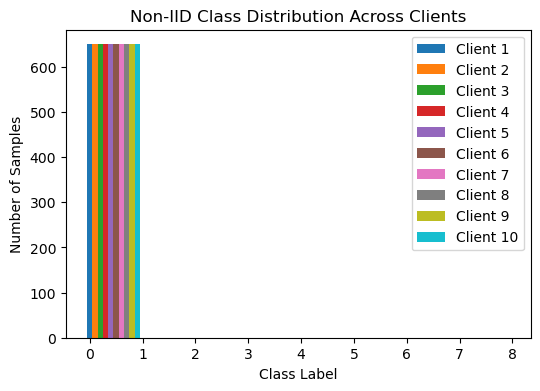



 Our:
Local learning done, transmitting
Local learning done, transmitting
Local learning done, transmitting
Number of clusters in federated model: 8


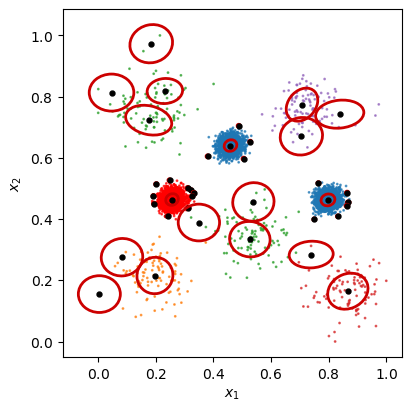

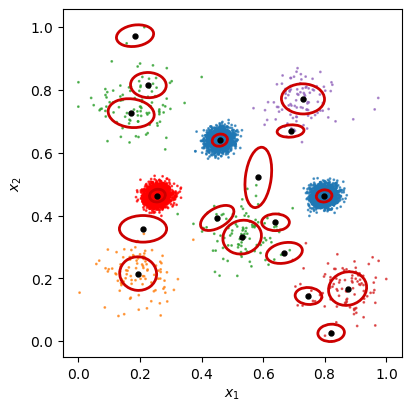

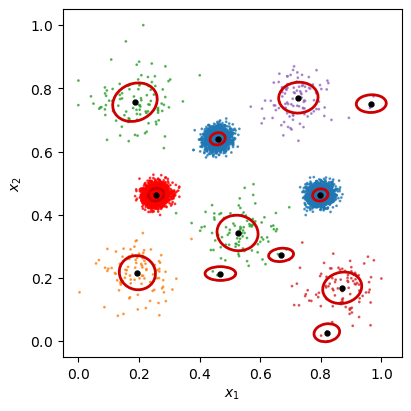

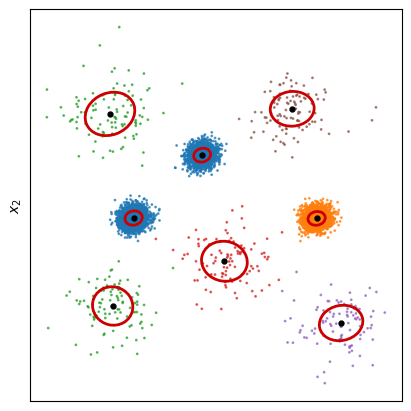

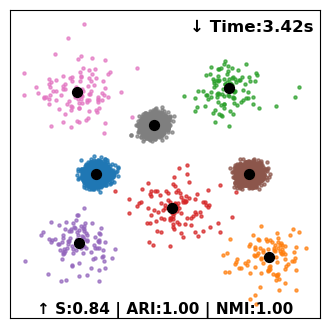

Execution time for Our_eFedG: 3.4238 seconds


In [ ]:
device = torch.device("cpu") # torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #


df_x = pd.read_csv(".datasets/Unbalance2.txt", delimiter=" ", header=None, engine='python')
df_y = pd.read_csv(".datasets/Unbalance2.pa", delimiter=" ", header=None, skiprows=4, engine='python')


X = df_x.values
y = df_y.values 
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
X = torch.tensor(X, dtype=torch.float32)

#y = torch.zeros(X.shape[0], dtype=torch.int64)
y = torch.tensor(y-1, dtype=torch.int64).squeeze()
num_clusters = 8

feature_dim = X.shape[1]
num_classes = 1

batch_size = int(np.ceil(len(y)/num_clients/10))

print("Unbalance2",
      f"\n Samples:   {X.shape[0]}",
      f"\n Features:  {feature_dim}",
      f"\n classes:   {num_classes}")

# Model parameters
local_model_params = {
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n": 1,
    "num_sigma": np.sqrt(feature_dim),
    "kappa_join": 0.7,
    "N_r": num_clusters,
    "c_max": batch_size,
    "kappa_features": 0,
    "device": device,
     "thr_relevance": 0.95
}

federated_model_params = local_model_params

if 0:
    %load_ext line_profiler
    %lprun -f run_benchmark_experiment \
    -f train_supervised \
    -f eFedG.batch_clustering.__wrapped__ \
    -f MathOps.compute_batched_activation.__wrapped__ \
    -f ClusteringOps.batch_update_clusters \
    -f ClusteringOps.compute_fisher_scores \
    -f ClusteringOps.batch_increment_clusters \
    -f ClusteringOps.kmeans_plusplus_init \
    -f ClusteringOps.reduce_by_label \
    -f ClusteringOps.add_new_clusters\
    -f ClusteringOps.batch_update_global_statistics \
    -f MergingMechanism.batch_merging_mechanism \
    -f MergingMechanism.compute_kappa \
    -f MergingMechanism.find_pairs \
    -f MergingMechanism.perform_merge \
    -f FederalOps.federated_merging \
    -f RemovalMechanism.batch_update_scores \
    -f RemovalMechanism.remove_clusters \
    run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag= 0, unlabeled=1, name = "Unbalance2", flag_axis = False, flag_noniid=False)
elif 1: 
    metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=0, debug_flag = 1, unlabeled=1, name = "Unbalance2", flag_axis = False, flag_noniid=False)



overlap 
 Samples:   1000 
 Features:  2 
 classes:   1
Eksperiment 1.


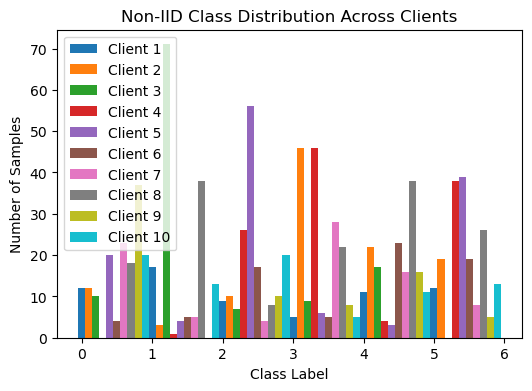



 Our:
Local learning done, transmitting
Local learning done, transmitting
Local learning done, transmitting
Number of clusters in federated model: 6


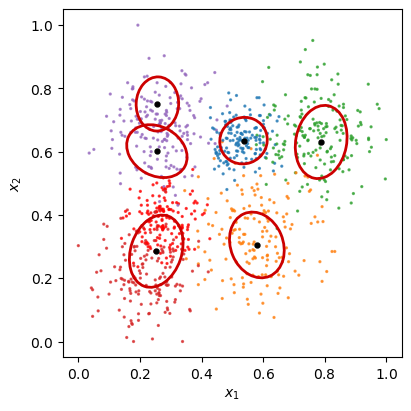

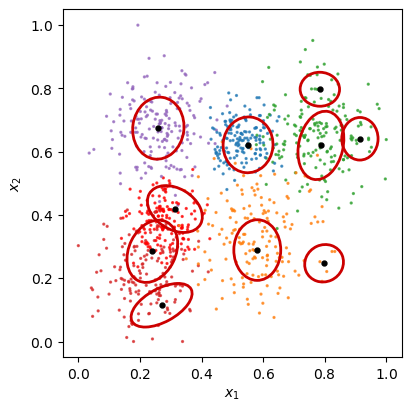

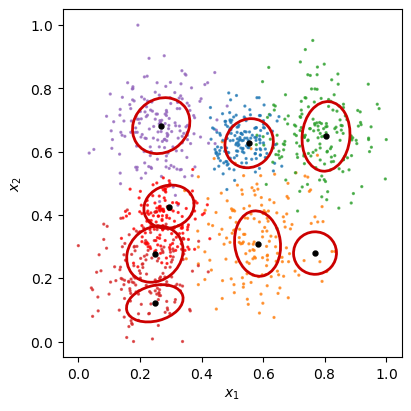

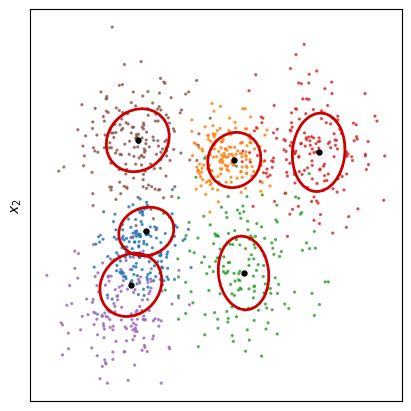

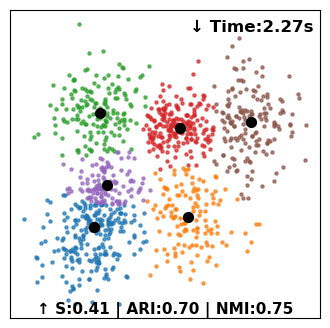

Execution time for Our_eFedG: 2.2729 seconds


In [57]:
device = torch.device("cpu") # torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #


df_x = pd.read_csv(".datasets/overlap.txt", delimiter=" ", header=None, engine='python')
df_y = pd.read_csv(".datasets/overlap.pa", delimiter=" ", header=None, skiprows=4, engine='python')


X = df_x.values
y = df_y.values 
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
X = torch.tensor(X, dtype=torch.float32)

#y = torch.zeros(X.shape[0], dtype=torch.int64)
y = torch.tensor(y-1, dtype=torch.int64).squeeze()

num_clusters = 6
feature_dim = X.shape[1]
num_classes = 1

batch_size = int(np.ceil(len(y)/num_clients/10))

print("overlap",
      f"\n Samples:   {X.shape[0]}",
      f"\n Features:  {feature_dim}",
      f"\n classes:   {num_classes}")

# Model parameters
local_model_params = {
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n": 1,
    "num_sigma":np.sqrt(feature_dim),
    "kappa_join": .7,
    "N_r": num_clusters,
    "c_max": batch_size,
    "kappa_features": 0.0,
    "device": device,
     "thr_relevance": 0.95
}
federated_model_params = local_model_params

if 1: 
    metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag= 1, unlabeled=1, name = "Overlap", flag_axis = False, flag_noniid=True)



skewed 
 Samples:   1000 
 Features:  2 
 classes:   1
Eksperiment 1.


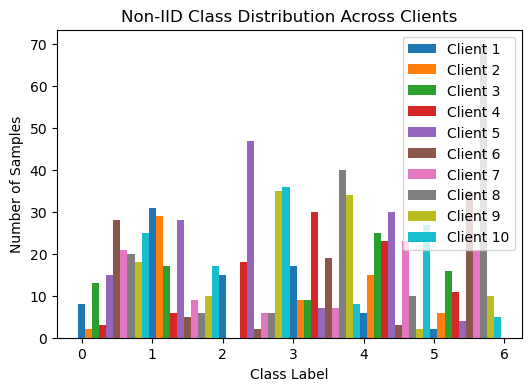



 Our:
Local learning done, transmitting
Local learning done, transmitting
Local learning done, transmitting
Number of clusters in federated model: 6


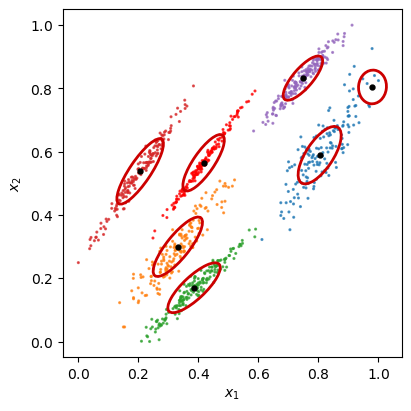

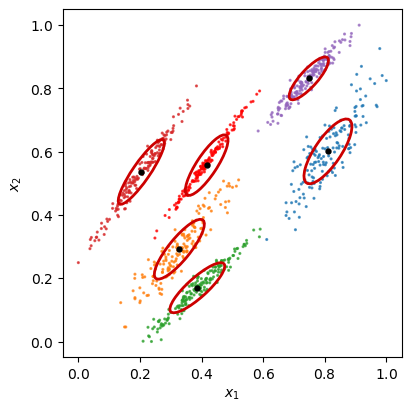

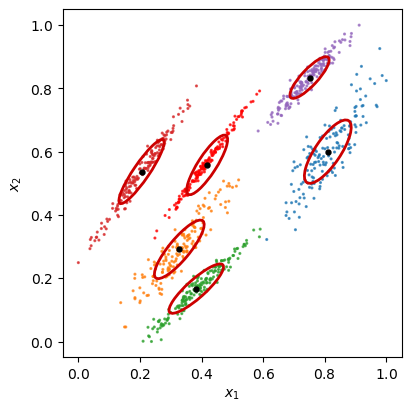

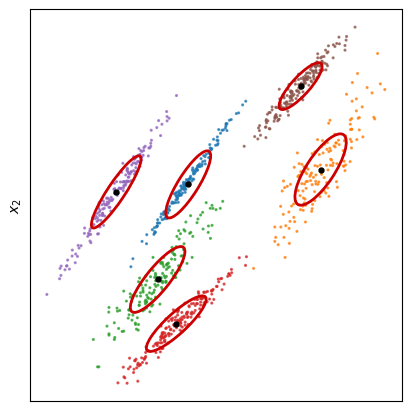

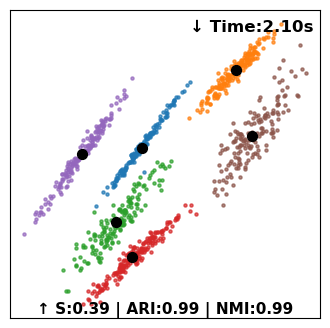

Execution time for Our_eFedG: 2.1017 seconds


In [76]:
device = torch.device("cpu") #torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #


df_x = pd.read_csv(".datasets/skewed.txt", delimiter=" ", header=None, engine='python')
df_y = pd.read_csv(".datasets/skewed.pa", delimiter=" ", header=None, skiprows=4, engine='python')


X = df_x.values
y = df_y.values 
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
X = torch.tensor(X, dtype=torch.float32)

#y = torch.zeros(X.shape[0], dtype=torch.int64)
y = torch.tensor(y-1, dtype=torch.int64).squeeze()

feature_dim = X.shape[1]
num_classes = 1
num_clusters = 6

batch_size = int(np.ceil(len(y)/num_clients/10))

print("skewed",
      f"\n Samples:   {X.shape[0]}",
      f"\n Features:  {feature_dim}",
      f"\n classes:   {num_classes}")

# Model parameters
local_model_params = {
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n": 1,
    "num_sigma": np.sqrt(feature_dim),
    "kappa_join": 0.7,
    "N_r": 2*num_clusters,
    "c_max": batch_size,
    "kappa_features": 0.0,
    "device": device,
    "thr_relevance": 0.95
}
federated_model_params = local_model_params

if 1:
    metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag=1, unlabeled=1, name = "Skewed", flag_axis = False, flag_noniid=True)
 #Best
 


In [19]:
rounds = 3
num_clients = 3
num_repetitions = 1

asymmetric 
 Samples:   1000 
 Features:  2 
 classes:   1
Eksperiment 1.


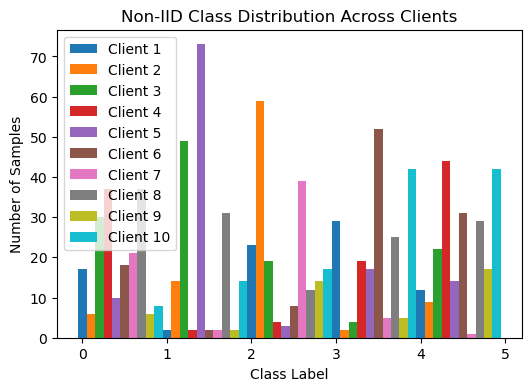



 Our:


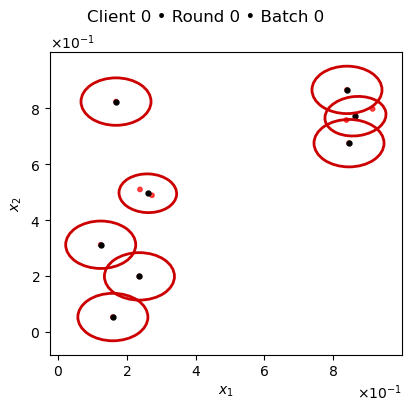

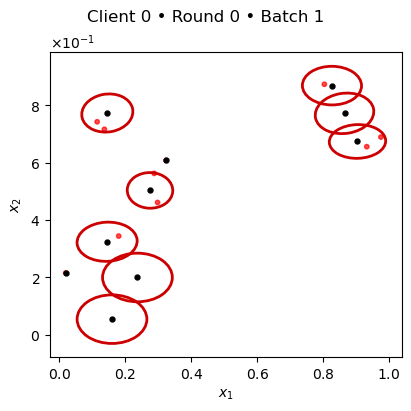

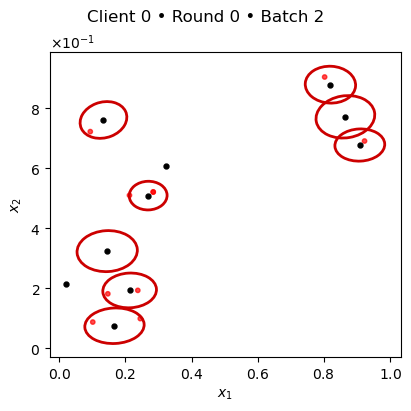

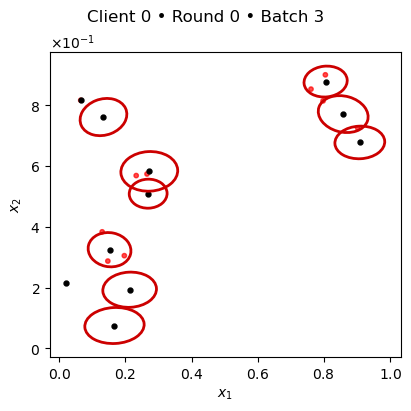

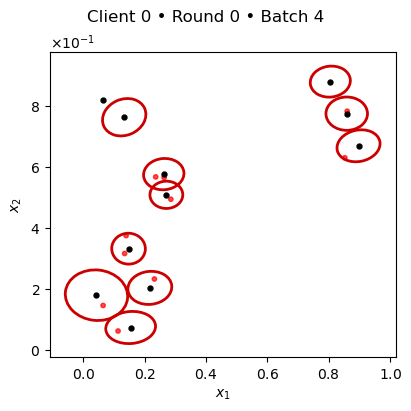

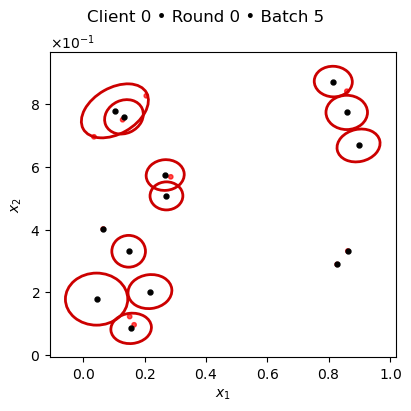

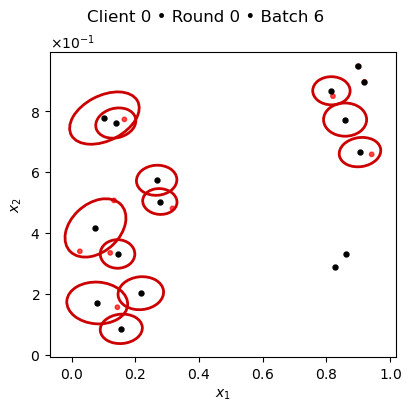

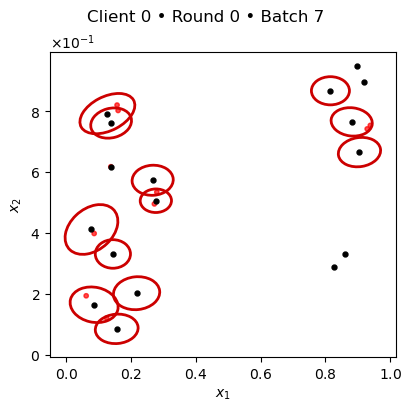

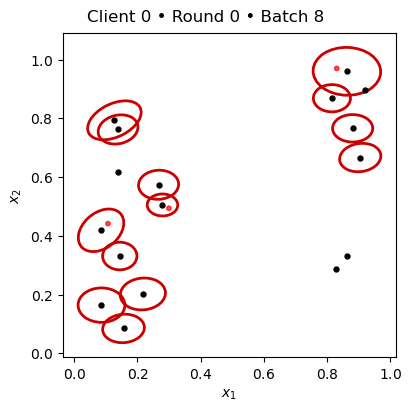

Local learning done, transmitting


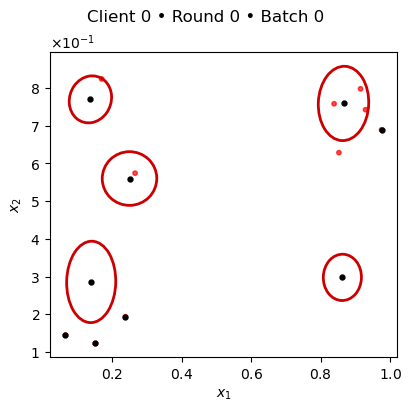

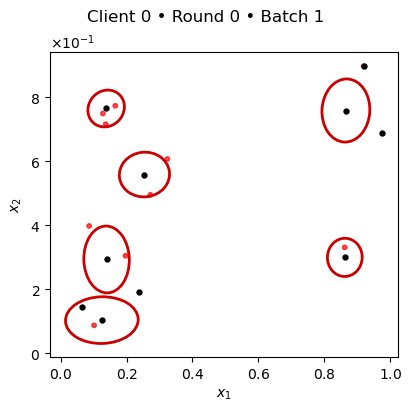

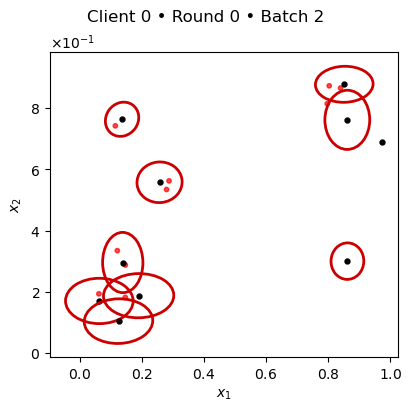

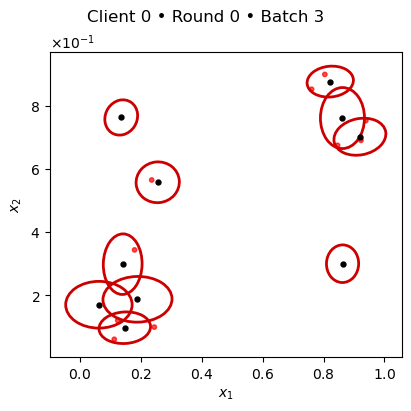

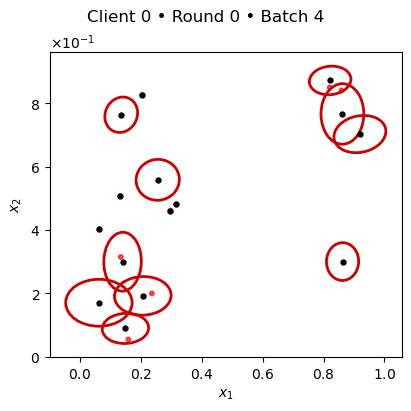

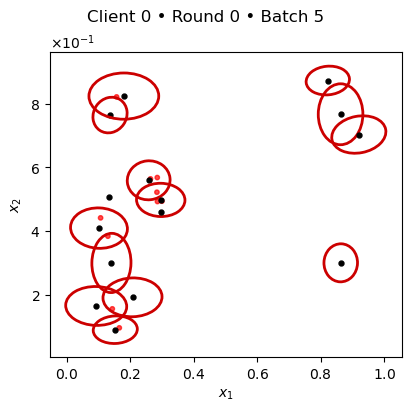

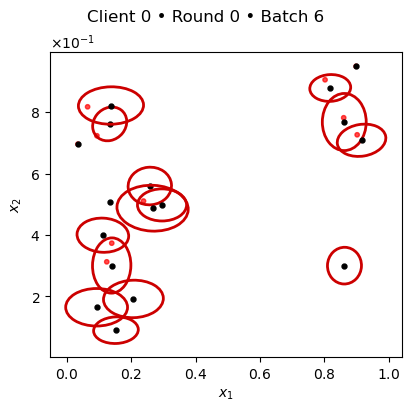

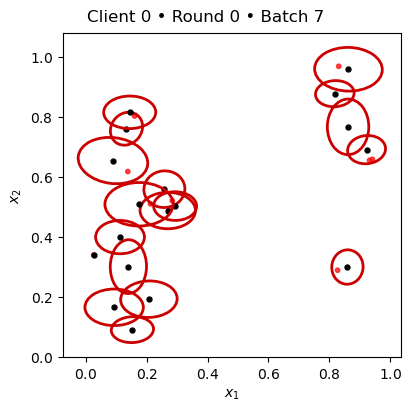

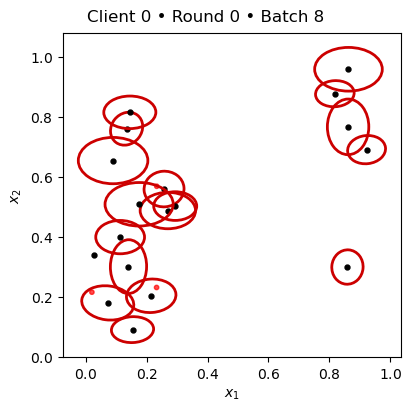

Local learning done, transmitting


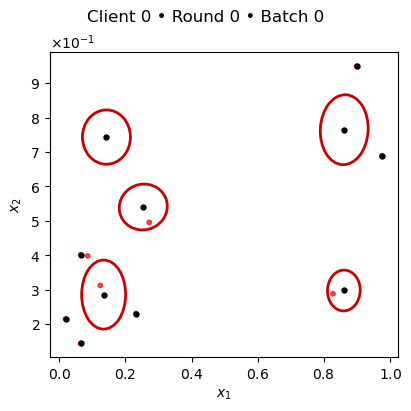

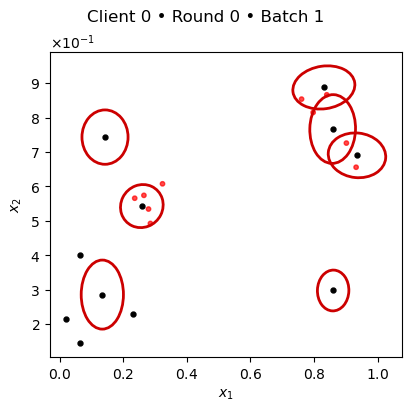

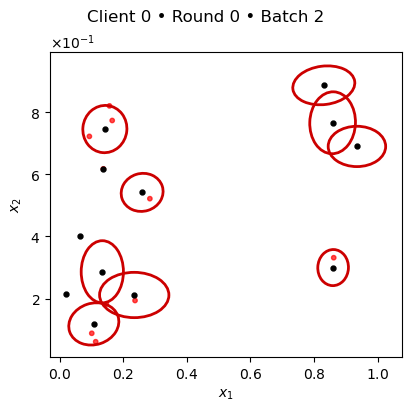

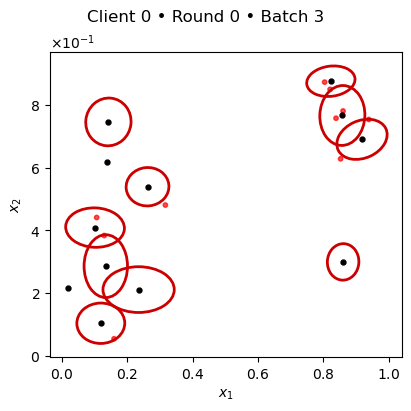

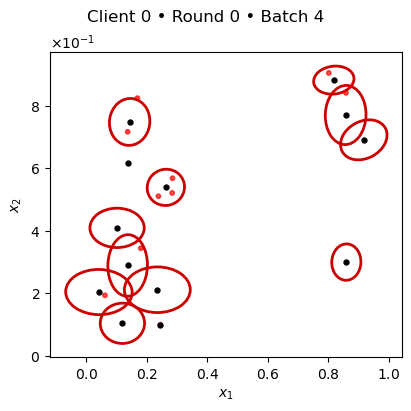

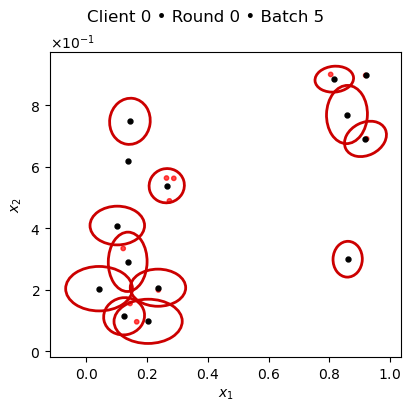

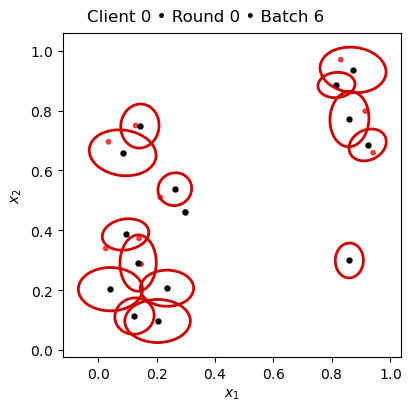

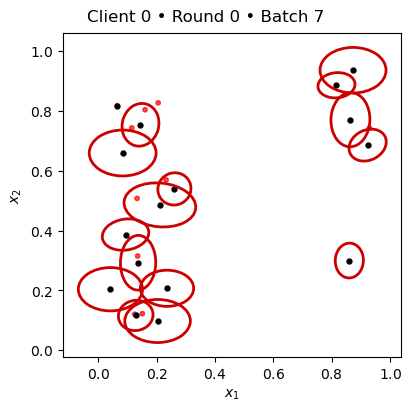

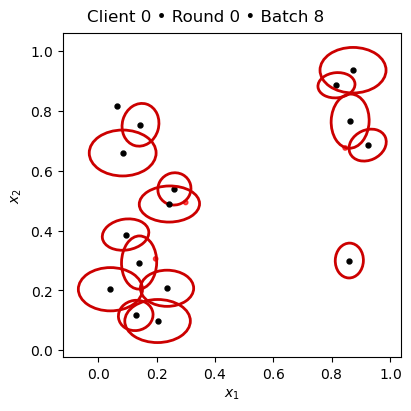

Local learning done, transmitting
Number of clusters in federated model: 5


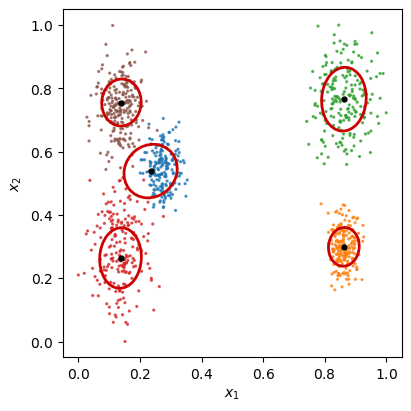

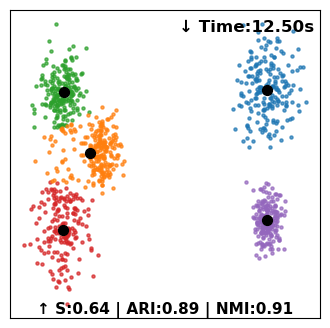

Execution time for Our_eFedG: 12.5044 seconds


In [77]:
device = torch.device("cpu") #torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #


df_x = pd.read_csv(".datasets/asymmetric.txt", delimiter=" ", header=None, engine='python')
df_y = pd.read_csv(".datasets/asymmetric.pa", delimiter=" ", header=None, skiprows=4, engine='python')


X = df_x.values
y = df_y.values 
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
X = torch.tensor(X, dtype=torch.float32)

#y = torch.zeros(X.shape[0], dtype=torch.int64)
y = torch.tensor(y-1, dtype=torch.int64).squeeze()


num_clusters = 5

feature_dim = X.shape[1]
num_classes = 1

batch_size = int(np.ceil(len(y)/(num_clients*10)))

print("asymmetric",
      f"\n Samples:   {X.shape[0]}",
      f"\n Features:  {feature_dim}",
      f"\n classes:   {num_classes}")


# Model parameters
local_model_params = {
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n": 1,
    "num_sigma": np.sqrt(feature_dim),
    "kappa_join":1/np.sqrt(feature_dim),
    "N_r": num_clusters,
    "c_max": batch_size,
    "kappa_features": 0.0,
    "device": device,
     "thr_relevance": 0.99
}
federated_model_params = local_model_params


if 1:
    metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag=9, unlabeled=1, name = "Asymmetric")


S1 
 Samples:   5000 
 Features:  2 
 classes:   1
Eksperiment 1.


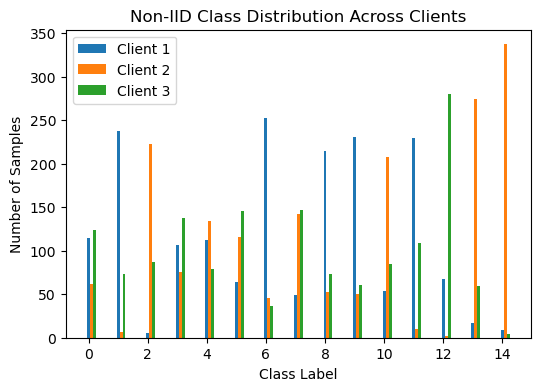



 Our:
Local learning done, transmitting
Local learning done, transmitting
Local learning done, transmitting
Number of clusters in federated model: 15


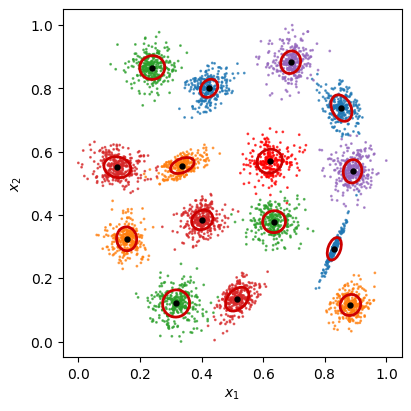

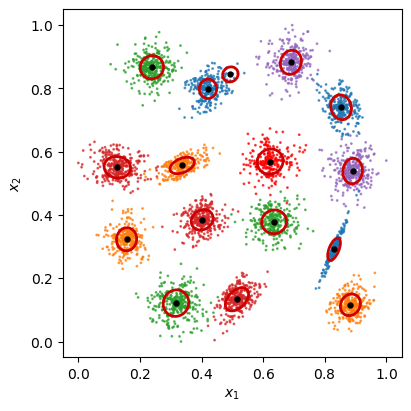

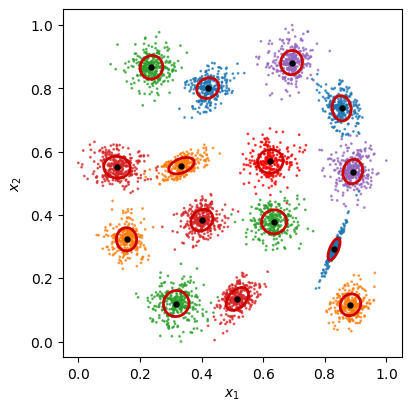

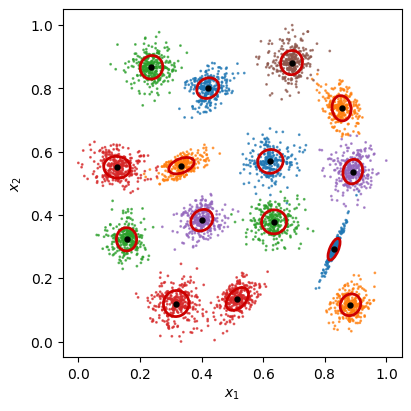

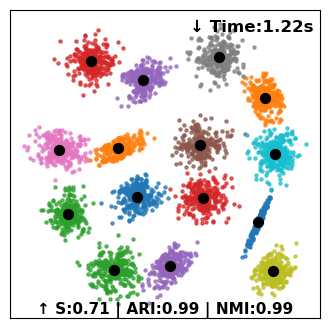

Execution time for Our_eFedG: 1.2249 seconds


In [21]:
device = torch.device("cpu") #torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #


df_x = pd.read_csv(".datasets/s1.txt", delimiter="\s+", header=None, engine='python')
df_y = pd.read_csv(".datasets/s1-label.pa", delimiter=" ", header=None, skiprows=5, engine='python')


X = df_x.values
y = df_y.values 
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
X = torch.tensor(X, dtype=torch.float32)

#y = torch.zeros(X.shape[0], dtype=torch.int64)
y = torch.tensor(y-1, dtype=torch.int64).squeeze()


num_clusters = 15

feature_dim = X.shape[1]
num_classes = 1

batch_size = int(np.ceil(len(y)/num_clients/10))

print("S1",
      f"\n Samples:   {X.shape[0]}",
      f"\n Features:  {feature_dim}",
      f"\n classes:   {num_classes}")

# Model parameters
local_model_params = {
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n": 1,
    "num_sigma": np.sqrt(feature_dim),
    "kappa_join": 1/np.sqrt(feature_dim),
    "N_r": num_clusters,
    "c_max": batch_size,
    "kappa_features": 0.0,
    "device": device,
     "thr_relevance": 0.99
}
federated_model_params = local_model_params

 
if 1:

    metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag= 1, unlabeled=1, name = "S1")


s2 
 Samples:   5000 
 Features:  2 
 classes:   1
Eksperiment 1.


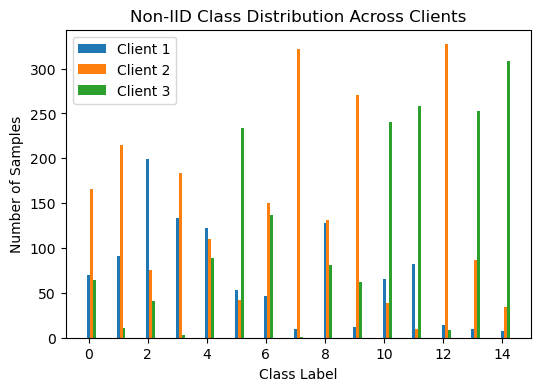



 Our:
Local learning done, transmitting


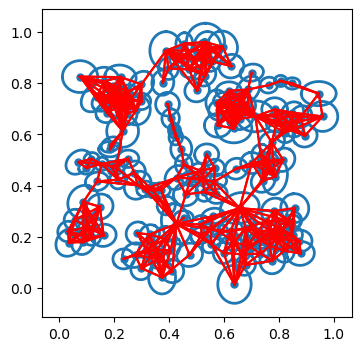

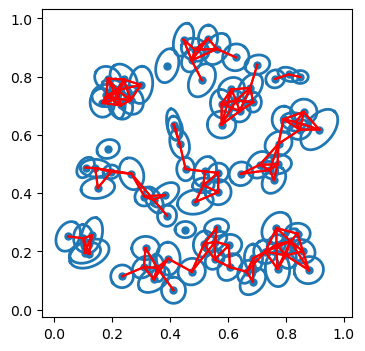

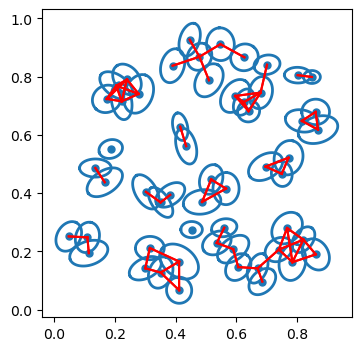

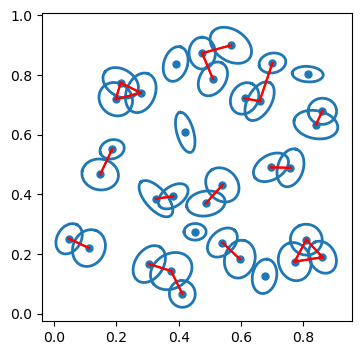

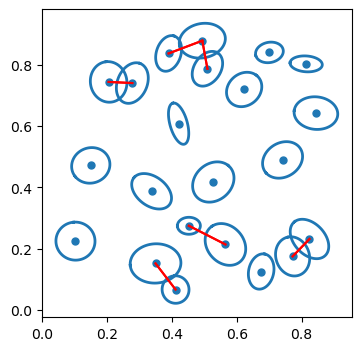

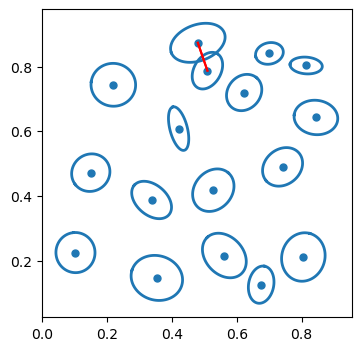

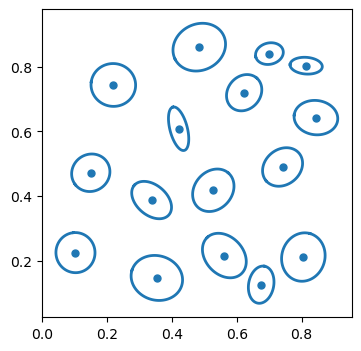

Local learning done, transmitting


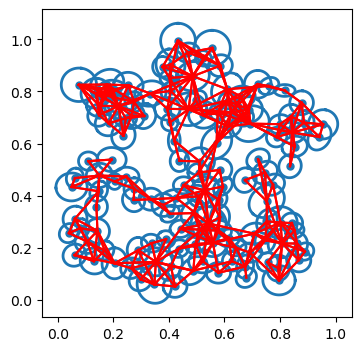

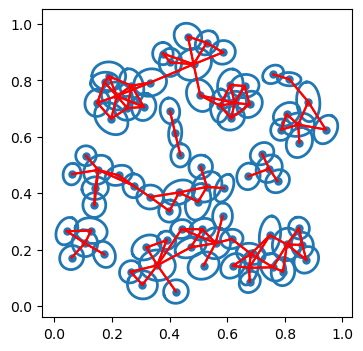

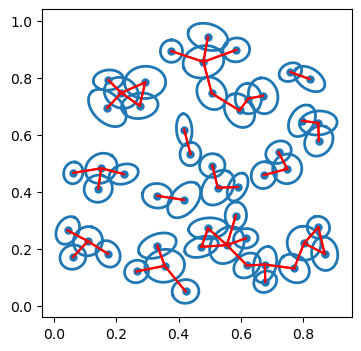

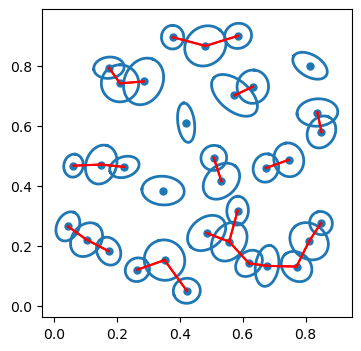

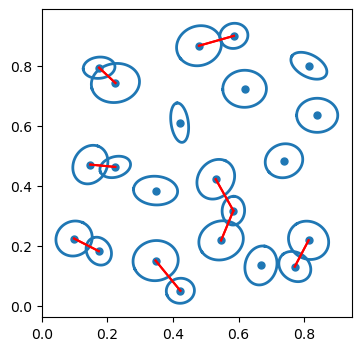

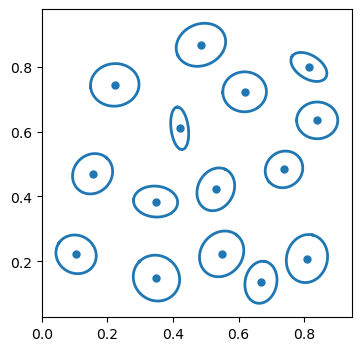

Local learning done, transmitting


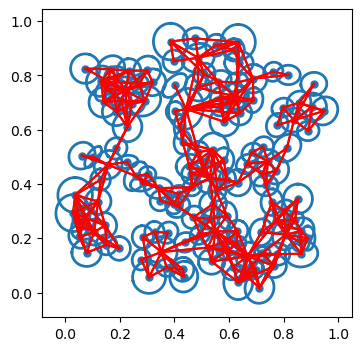

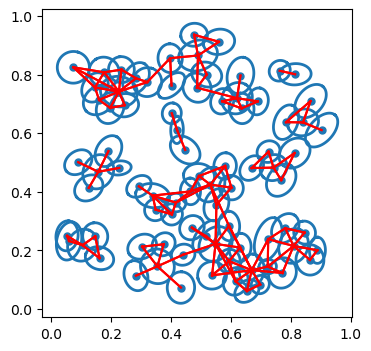

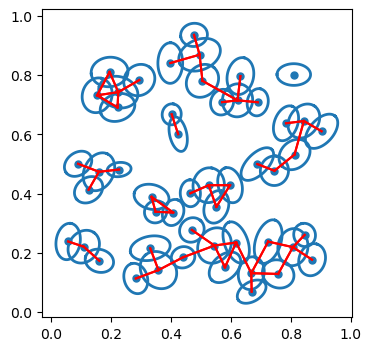

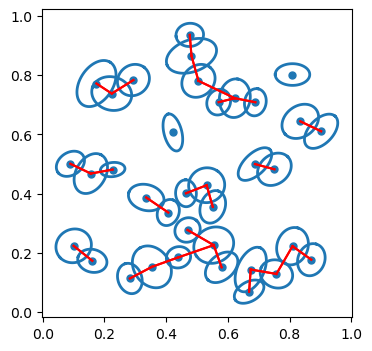

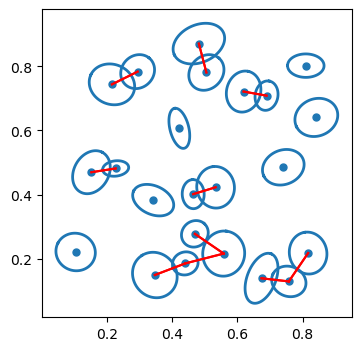

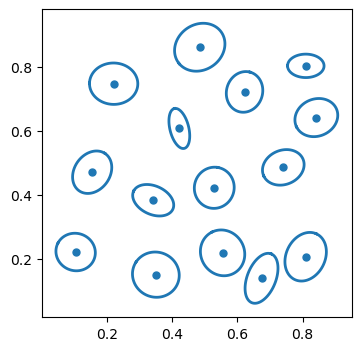

Number of clusters in federated model: 15


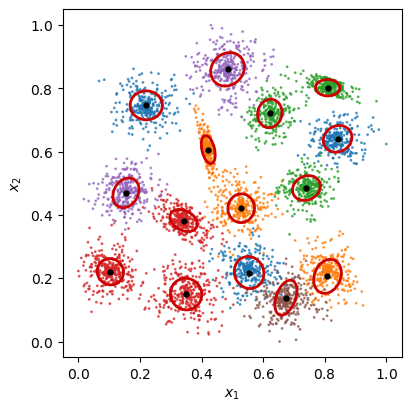

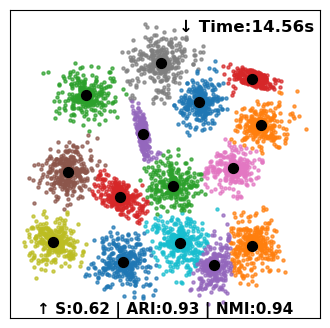

Execution time for Our_eFedG: 14.5592 seconds


In [22]:
device = torch.device("cpu") #torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #


df_x = pd.read_csv(".datasets/s2.txt", delimiter="\s+", header=None, engine='python')
df_y = pd.read_csv(".datasets/s2-label.pa", delimiter=" ", header=None, skiprows=5, engine='python')


X = df_x.values
y = df_y.values 
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
X = torch.tensor(X, dtype=torch.float32)

#y = torch.zeros(X.shape[0], dtype=torch.int64)
y = torch.tensor(y-1, dtype=torch.int64).squeeze()


num_clusters = 15
num_classes = 1

batch_size = int(np.ceil(len(y)/num_clients/10))

print("s2",
      f"\n Samples:   {X.shape[0]}",
      f"\n Features:  {feature_dim}",
      f"\n classes:   {num_classes}")

# Model parameters
local_model_params = {
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n": 1,
    "num_sigma": np.sqrt(feature_dim),
    "kappa_join":1/np.sqrt(feature_dim),
    "N_r": num_clusters,
    "c_max": batch_size,
    "kappa_features": 0.0,
    "device": device,
     "thr_relevance": 0.98
}
federated_model_params = local_model_params

if 1:
   metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag= 11, unlabeled=1 , name = "S2")
    

s3 
 Samples:   5000 
 Features:  2 
 classes:   1
Eksperiment 1.


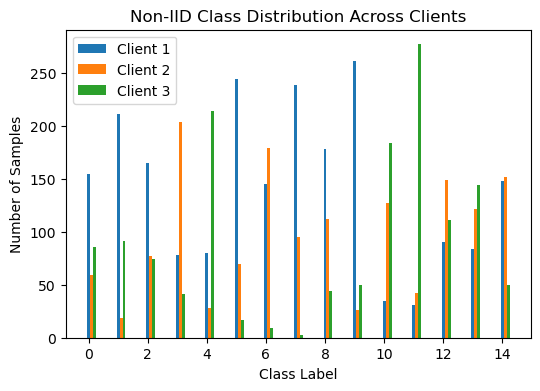



 Our:
Local learning done, transmitting
Local learning done, transmitting
Local learning done, transmitting
Number of clusters in federated model: 16


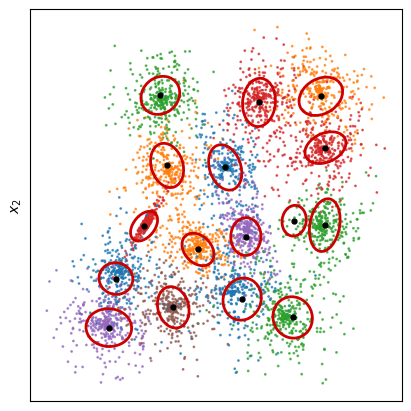

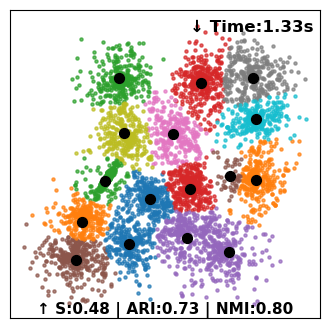

Execution time for Our_eFedG: 1.3262 seconds


In [23]:
device = torch.device("cpu") #torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #


df_x = pd.read_csv(".datasets/s3.txt", delimiter="\s+", header=None, engine='python')
df_y = pd.read_csv(".datasets/s3-label.pa", delimiter=" ", header=None, skiprows=5, engine='python')


X = df_x.values
y = df_y.values 
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
X = torch.tensor(X, dtype=torch.float32)

#y = torch.zeros(X.shape[0], dtype=torch.int64)
y = torch.tensor(y-1, dtype=torch.int64).squeeze()


num_clusters = 15

batch_size = int(np.ceil(len(y)/num_clients/10))

# Model parameters
local_model_params = {
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n": 1,
    "num_sigma": np.sqrt(feature_dim),
    "kappa_join": 0.7,
    "N_r": num_clusters,
    "c_max": batch_size,
    "kappa_features": 0.0,
    "device": device,
     "thr_relevance": 0.99
}
federated_model_params = local_model_params


print("s3",
      f"\n Samples:   {X.shape[0]}",
      f"\n Features:  {feature_dim}",
      f"\n classes:   {num_classes}")


if 1:
    
    metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag= 0, unlabeled=1, name = "S3", flag_axis=False)



s4 
 Samples:   5000 
 Features:  2 
 classes:   1
Eksperiment 1.


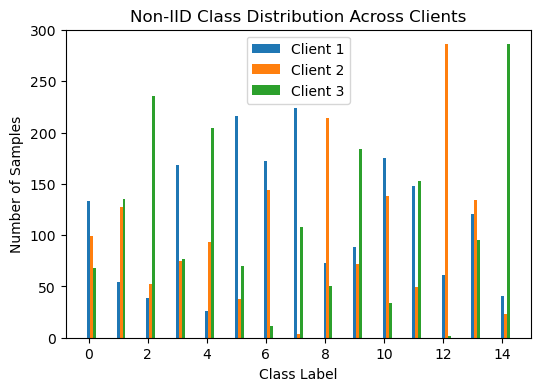



 Our:
Local learning done, transmitting
Local learning done, transmitting
Local learning done, transmitting
Number of clusters in federated model: 16


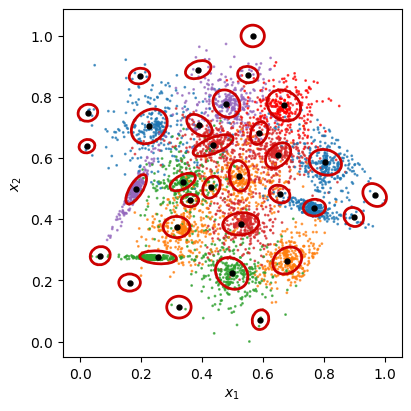

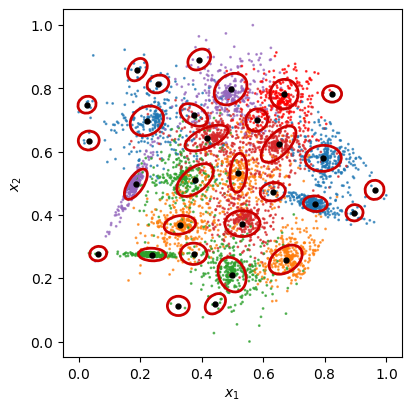

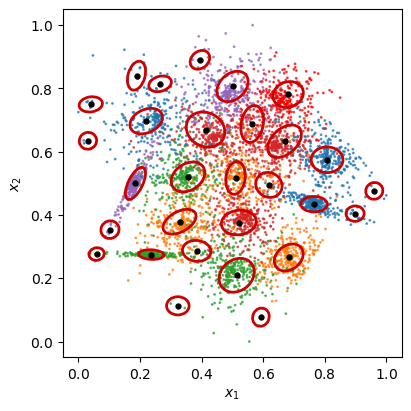

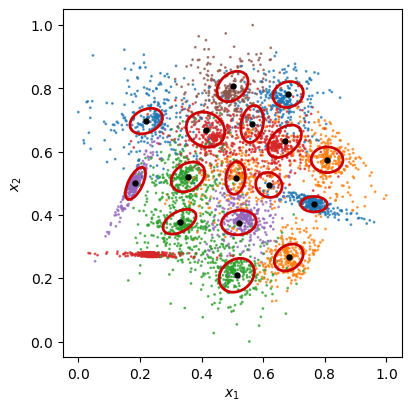

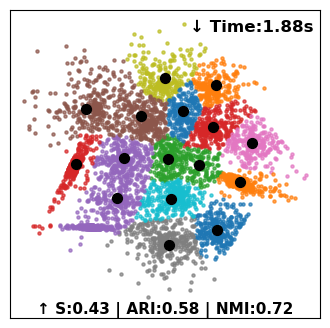

Execution time for Our_eFedG: 1.8809 seconds


In [ ]:
device = torch.device("cpu") #torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #


df_x = pd.read_csv(".datasets/s4.txt", delimiter="\s+", header=None, engine='python')
df_y = pd.read_csv(".datasets/s4-label.pa", delimiter=" ", header=None, skiprows=5, engine='python')


X = df_x.values
y = df_y.values 
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
X = torch.tensor(X, dtype=torch.float32)

#y = torch.zeros(X.shape[0], dtype=torch.int64)
y = torch.tensor(y-1, dtype=torch.int64).squeeze()


num_clusters = 15

batch_size = int(np.ceil(len(y)/num_clients/10))

print("s4",
      f"\n Samples:   {X.shape[0]}",
      f"\n Features:  {feature_dim}",
      f"\n classes:   {num_classes}")

# Model parameters
local_model_params = { 
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n": 1,
    "num_sigma": np.sqrt(feature_dim),
    "kappa_join":0.7,
    "N_r": num_clusters,
    "c_max": batch_size,
    "kappa_features": 0.0,
    "device": device,
     "thr_relevance": 0.98
}
federated_model_params = local_model_params


federated_model_params = local_model_params

if 1:

    metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag=16, unlabeled=1, name = "S4")



Aggregation 
 Samples:   788 
 Features:  2 
 classes:   1
Eksperiment 1.


C:\Users\Miha\AppData\Local\Temp\ipykernel_7668\2998956472.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(y-1, dtype=torch.int64).squeeze()


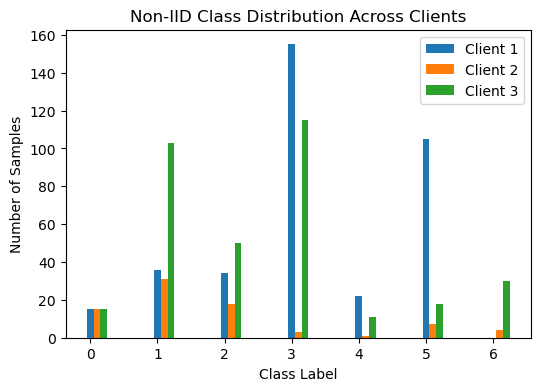



 Our:
Local learning done, transmitting
Local learning done, transmitting
Local learning done, transmitting
Number of clusters in federated model: 8


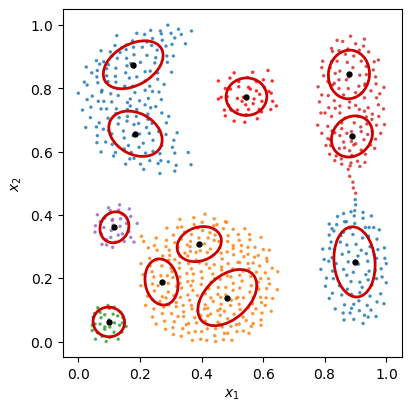

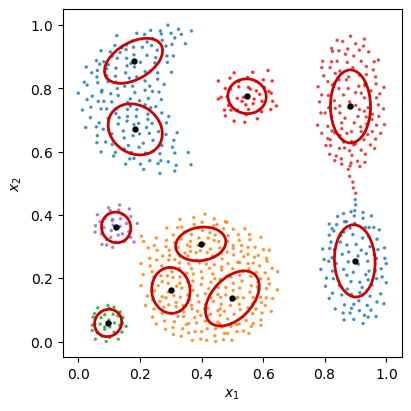

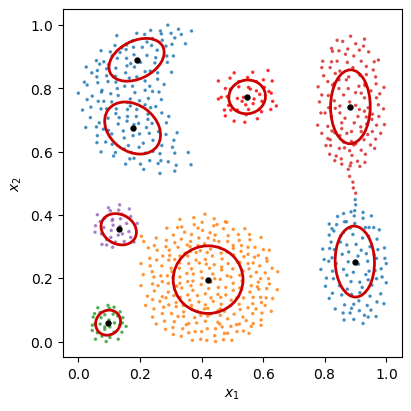

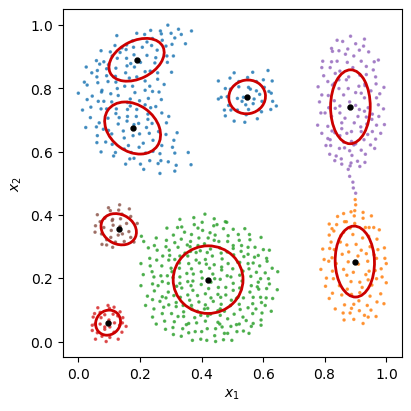

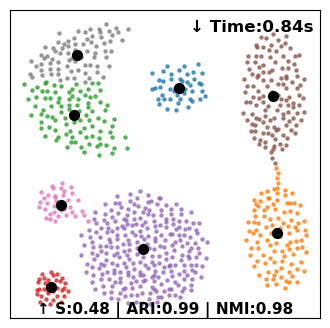

Execution time for Our_eFedG: 0.8437 seconds


In [25]:
device = torch.device("cpu") #torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #


df = pd.read_csv(".datasets/Aggregation.txt", delimiter="\t", header=None)
X = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,0:2]
X  = (X  - torch.min(X, dim=0)[0]) / (torch.max(X, dim=0)[0] - torch.min(X, dim=0)[0])
#X = (X - torch.mean(X, dim=0)) / torch.std(X, dim=0)
y = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,2]
y = torch.tensor(y-1, dtype=torch.int64).squeeze()

feature_dim = X.shape[1]
num_classes = 1
num_clusters = 10
batch_size = int(np.ceil(len(y)/num_clients/10))

print("Aggregation",
      f"\n Samples:   {X.shape[0]}",
      f"\n Features:  {feature_dim}",
      f"\n classes:   {num_classes}")

# Model parameters
local_model_params = {
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n": 1,
    "num_sigma": np.sqrt(feature_dim),
    "kappa_join": 0.7,
    "N_r": num_clusters,
    "c_max": batch_size,
    "kappa_features": 0.0,
    "device": device,
     "thr_relevance": 1
}
federated_model_params = local_model_params

if 1:
    metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag= 1, unlabeled=1, name="Aggregation")



Compound 
 Samples:   399 
 Features:  2 
 classes:   1
Eksperiment 1.


C:\Users\Miha\AppData\Local\Temp\ipykernel_7668\4054886237.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(y-1, dtype=torch.int64).squeeze()


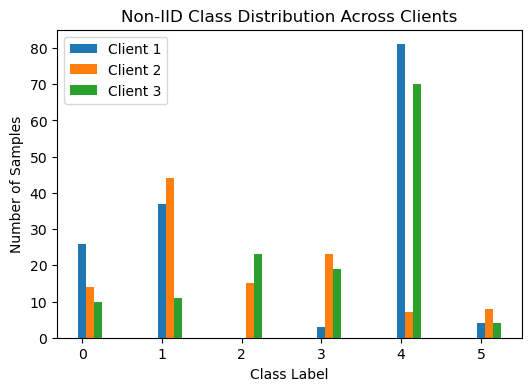



 Our:
Local learning done, transmitting
Local learning done, transmitting
Local learning done, transmitting
Number of clusters in federated model: 14


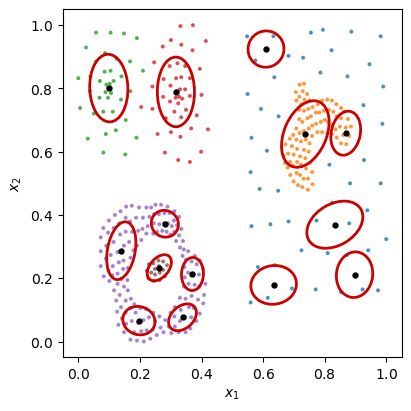

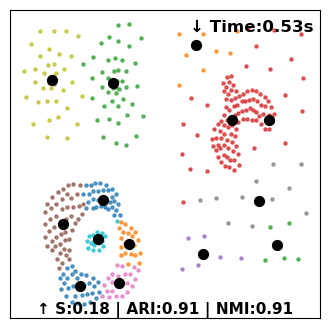

Execution time for Our_eFedG: 0.5280 seconds


In [26]:

device = torch.device("cpu") #torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #


df = pd.read_csv(".datasets/Compound.txt", delimiter="\t", header=None)

X = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,0:2]
X  = (X  - torch.min(X, dim=0)[0]) / (torch.max(X, dim=0)[0] - torch.min(X, dim=0)[0])
#X = (X - torch.mean(X, dim=0)) / torch.std(X, dim=0)
y = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,2]
y = torch.tensor(y-1, dtype=torch.int64).squeeze()

feature_dim = X.shape[1]
num_classes = 1
num_clusters = 10
batch_size = int(np.ceil(len(y)/num_clients/10))

print("Compound",
    f"\n Samples:   {X.shape[0]}",
    f"\n Features:  {feature_dim}",
    f"\n classes:   {num_classes}")


# Model parameters
local_model_params = {
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n": 1,
    "num_sigma": np.sqrt(feature_dim),
    "kappa_join":1/np.sqrt(feature_dim),
    "N_r": num_clusters,
    "c_max": batch_size,
    "kappa_features": 0.0,
    "device": device,
     "thr_relevance": 0.99
}
federated_model_params = local_model_params


if 1:

    metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag= False, unlabeled=1, name="Compound")



Compound 
 Samples:   300 
 Features:  2 
 classes:   1
Eksperiment 1.


C:\Users\Miha\AppData\Local\Temp\ipykernel_7668\4027046443.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(y-1, dtype=torch.int64).squeeze()


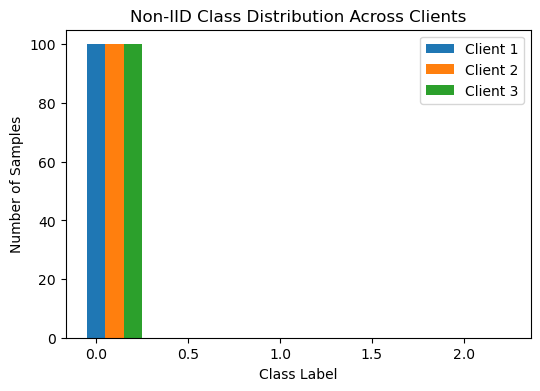



 Our:
Local learning done, transmitting


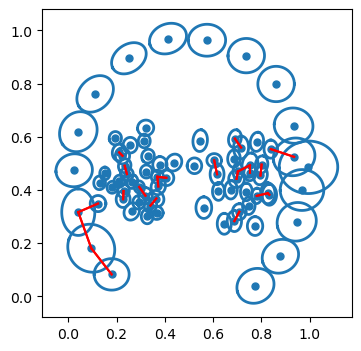

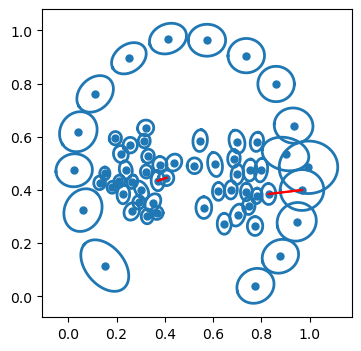

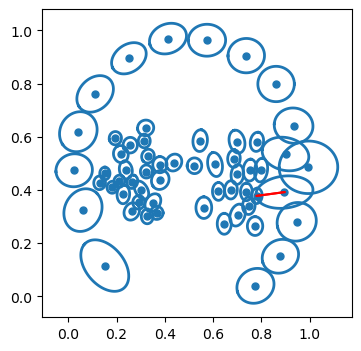

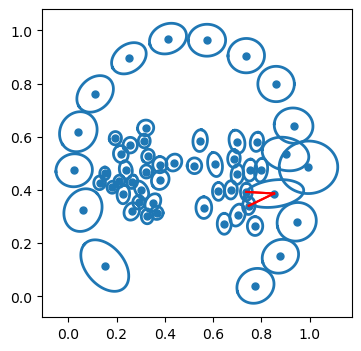

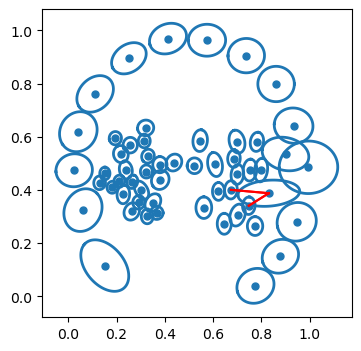

...

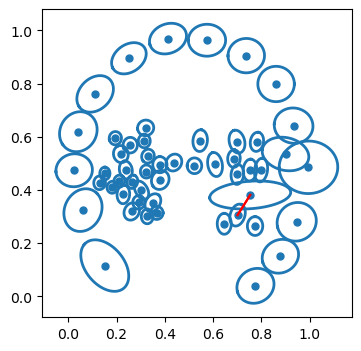

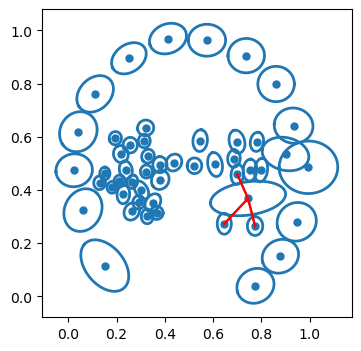

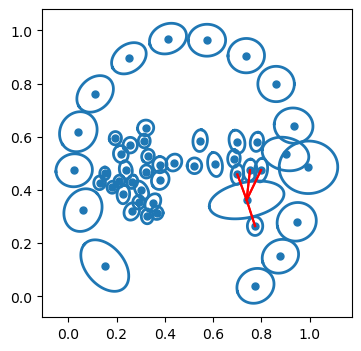

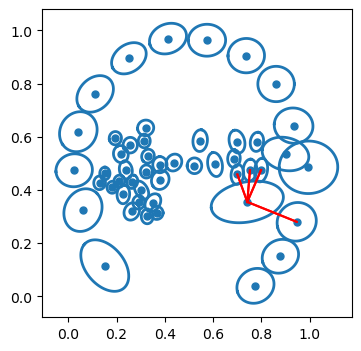

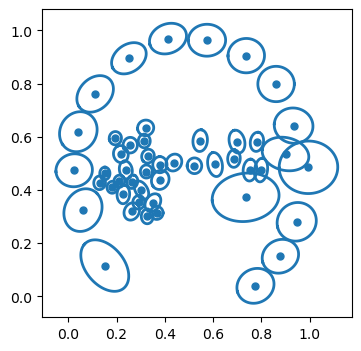

Local learning done, transmitting


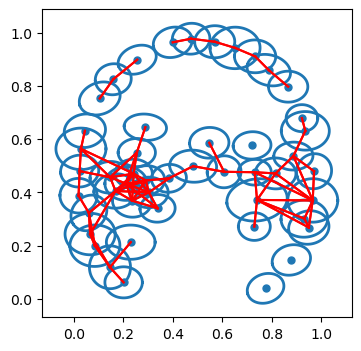

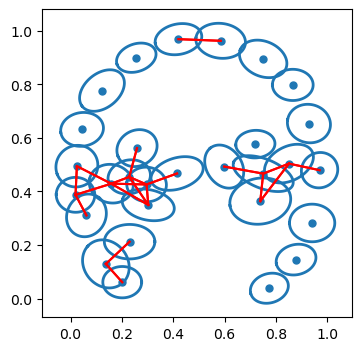

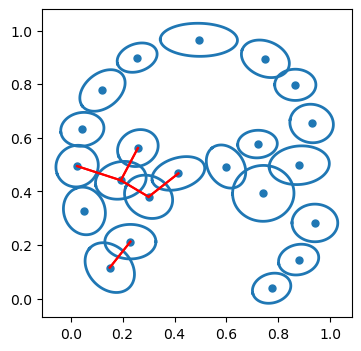

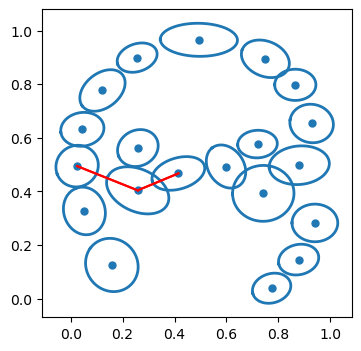

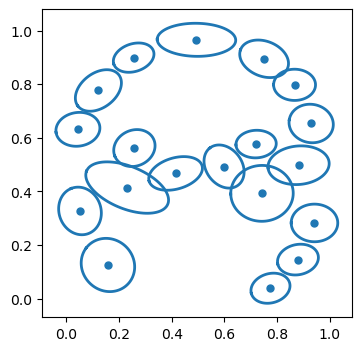

Local learning done, transmitting


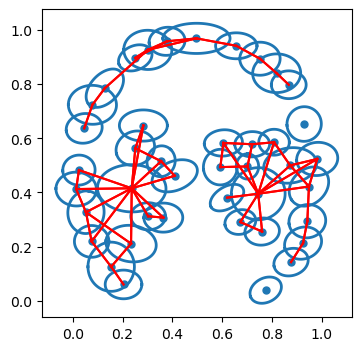

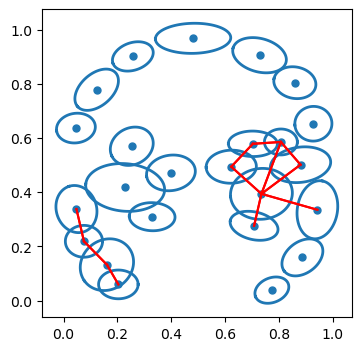

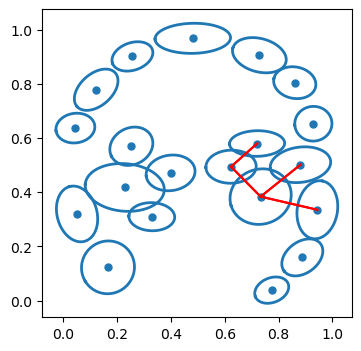

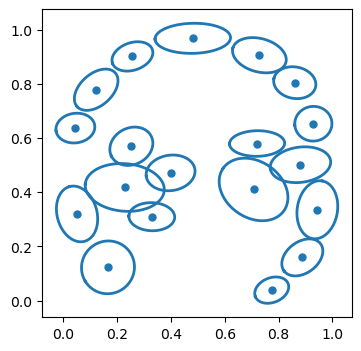

Number of clusters in federated model: 19


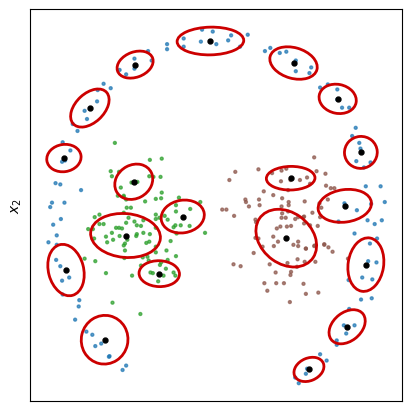

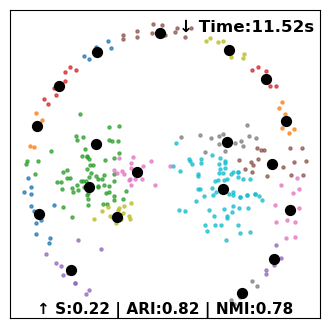

Execution time for Our_eFedG: 11.5242 seconds


In [27]:

device = torch.device("cpu") #


df = pd.read_csv(".datasets/pathbased.txt", delimiter="\t", header=None)

X = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,0:2]
X  = (X  - torch.min(X, dim=0)[0]) / (torch.max(X, dim=0)[0] - torch.min(X, dim=0)[0])
#X = (X - torch.mean(X, dim=0)) / torch.std(X, dim=0)
y = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,2]
y = torch.tensor(y-1, dtype=torch.int64).squeeze()
    
feature_dim = X.shape[1]
num_classes = 1
num_clients = 3
num_clusters = 10
batch_size = int(np.ceil(len(y)/num_clients/10))

print("Compound",
      f"\n Samples:   {X.shape[0]}",
      f"\n Features:  {feature_dim}",
      f"\n classes:   {num_classes}")

# Model parameters
local_model_params = {
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n": 1,
    "num_sigma": np.sqrt(feature_dim),
    "kappa_join": 0.7,
    "N_r": num_clusters,
    "c_max": batch_size,
    "kappa_features": 0.0,
    "device": device,
     "thr_relevance": 1
}
federated_model_params = local_model_params


if 1:
    metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag= 11, unlabeled=1, name = "Pathbased", flag_axis = False, flag_noniid=False)




Spiral 
 Samples:   312 
 Features:  2 
 classes:   1
Eksperiment 1.


C:\Users\Miha\AppData\Local\Temp\ipykernel_7668\3228100801.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(y-1, dtype=torch.int64).squeeze()


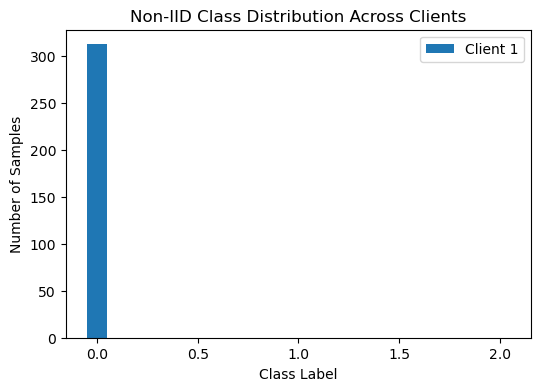



 Our:
Local learning done, transmitting


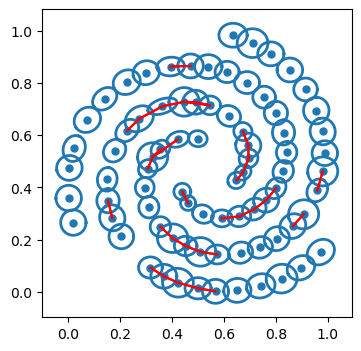

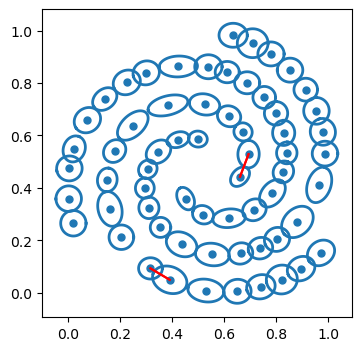

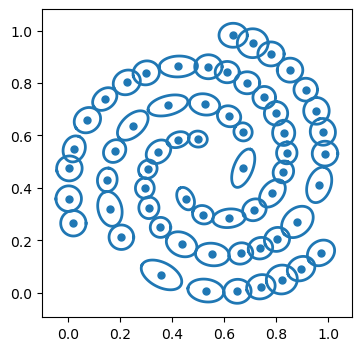

Local learning done, transmitting


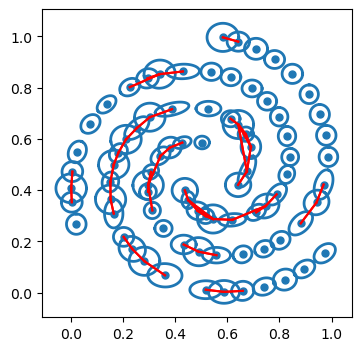

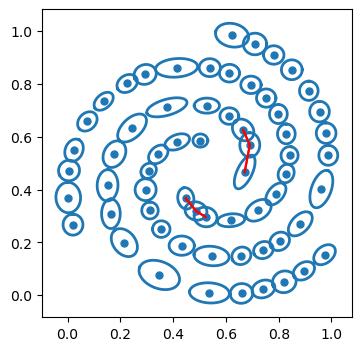

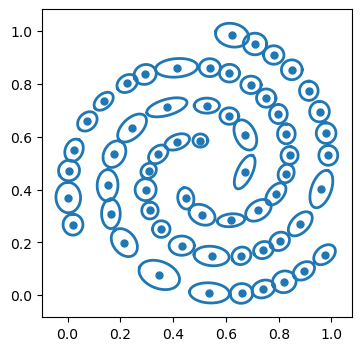

Local learning done, transmitting


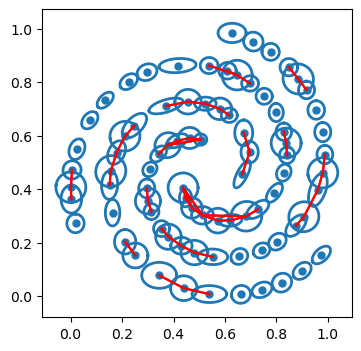

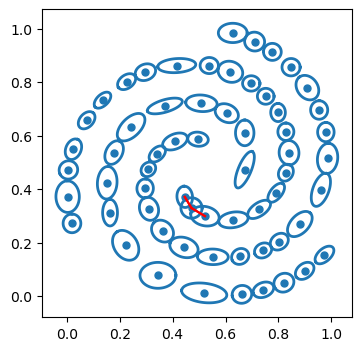

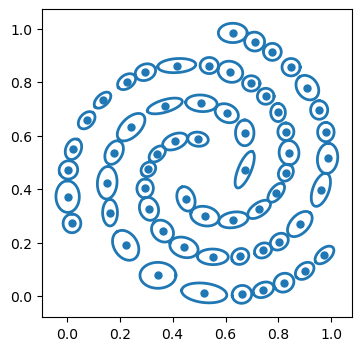

Number of clusters in federated model: 61


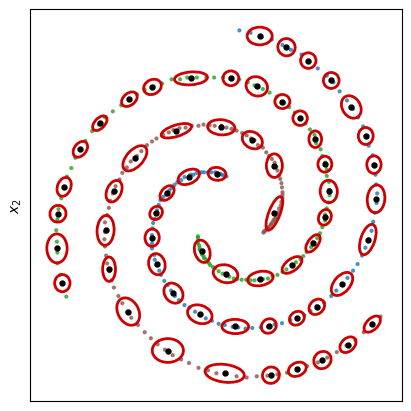

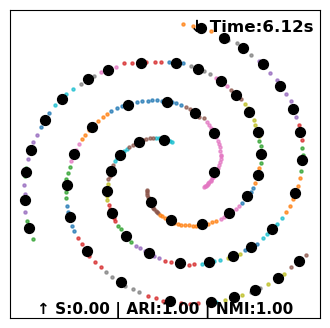

Execution time for Our_eFedG: 6.1196 seconds


In [28]:
device =torch.device("cpu") # torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #


df = pd.read_csv(".datasets/spiral.txt", delimiter="\t", header=None)

X = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,0:2]
X  = (X  - torch.min(X, dim=0)[0]) / (torch.max(X, dim=0)[0] - torch.min(X, dim=0)[0])
#X = (X - torch.mean(X, dim=0)) / torch.std(X, dim=0)
y = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,2]
y = torch.tensor(y-1, dtype=torch.int64).squeeze()

#y = torch.zeros_like(y-1, dtype=torch.int64).squeeze()

feature_dim = X.shape[1]
num_classes = 1
num_clusters = 20
num_clients = 1
batch_size = int(np.ceil(len(y)/num_clients/10))

print("Spiral",
      f"\n Samples:   {X.shape[0]}",
      f"\n Features:  {feature_dim}",
      f"\n classes:   {num_classes}")


# Model parameters
local_model_params = {
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n": 1,
    "num_sigma": np.sqrt(feature_dim),
    "kappa_join": 0.7,
    "N_r": num_clusters,
    "c_max": batch_size,
    "kappa_features": 0.0,
    "device": device,
     "thr_relevance": 1
}
federated_model_params = local_model_params

if 1:

    metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag= 11, unlabeled=1, name = "Spiral", flag_axis = False, flag_noniid=False)



D31 
 Samples:   3100 
 Features:  2 
 classes:   1
Eksperiment 1.


C:\Users\Miha\AppData\Local\Temp\ipykernel_7668\533338054.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(y-1, dtype=torch.int64).squeeze()


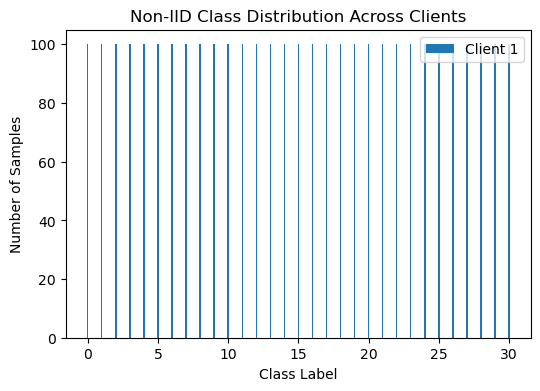



 Our:
Local learning done, transmitting
Local learning done, transmitting
Local learning done, transmitting
Number of clusters in federated model: 31


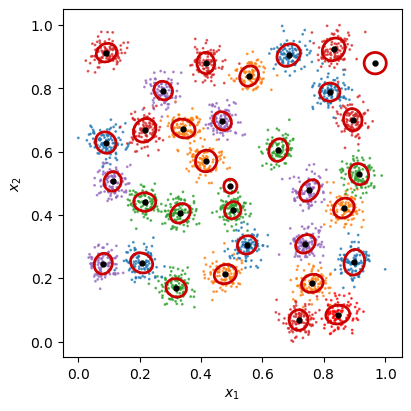

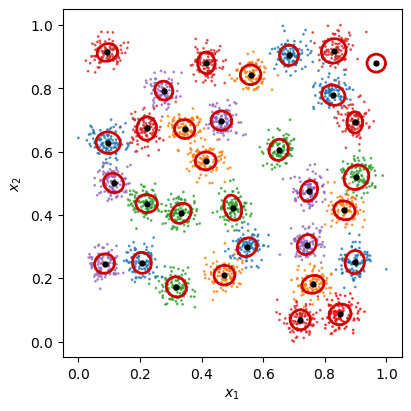

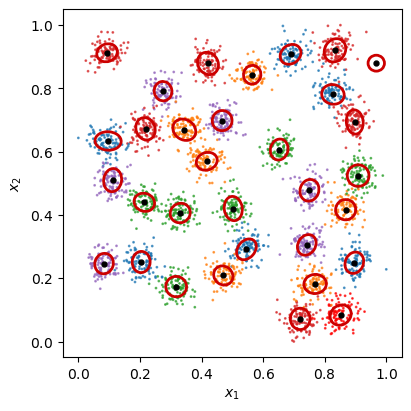

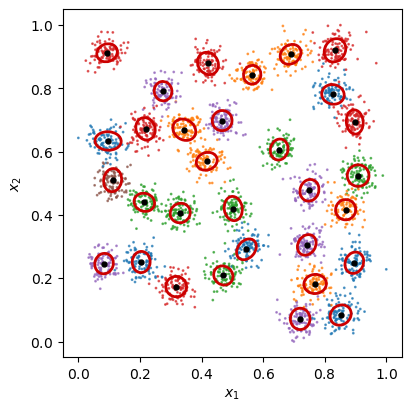

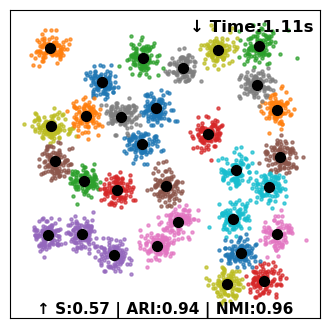

Execution time for Our_eFedG: 1.1135 seconds


In [29]:

device = torch.device("cpu") #torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #


df = pd.read_csv(".datasets/D31.txt", delimiter="\t", header=None)

X = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,0:2]
X  = (X  - torch.min(X, dim=0)[0]) / (torch.max(X, dim=0)[0] - torch.min(X, dim=0)[0])
#X = (X - torch.mean(X, dim=0)) / torch.std(X, dim=0)

y = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,2]
y = torch.tensor(y-1, dtype=torch.int64).squeeze()
num_clusters = len(np.unique(y))

feature_dim = X.shape[1]
num_classes = 1

batch_size = int(np.ceil(len(y)/num_clients/10))

print("D31",
      f"\n Samples:   {X.shape[0]}",
      f"\n Features:  {feature_dim}",
      f"\n classes:   {num_classes}")

# Model parameters
local_model_params = {
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n": 1,
    "num_sigma": np.sqrt(feature_dim),
    "kappa_join":1/np.sqrt(feature_dim),
    "N_r": num_clusters,
    "c_max": batch_size,
    "kappa_features": 0.0,
    "device": device,
     "thr_relevance": 0.99
}
federated_model_params = local_model_params

if 1:
    metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag = 1, unlabeled=1, name = "D31")



R15 
 Samples:   600 
 Features:  2 
 classes:   1
Eksperiment 1.


C:\Users\Miha\AppData\Local\Temp\ipykernel_7668\1197423524.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(y-1, dtype=torch.int64).squeeze()


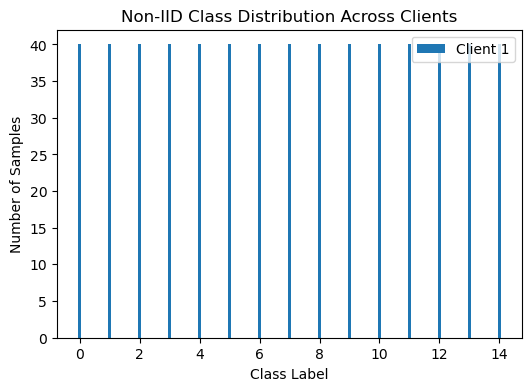



 Our:
Local learning done, transmitting
Local learning done, transmitting
Local learning done, transmitting
Number of clusters in federated model: 15


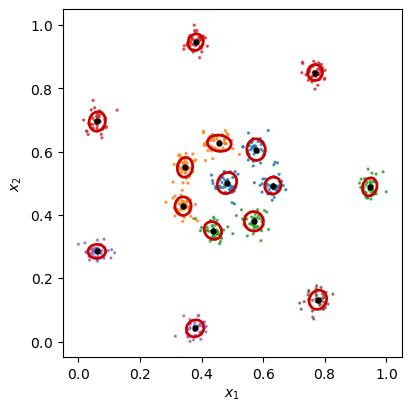

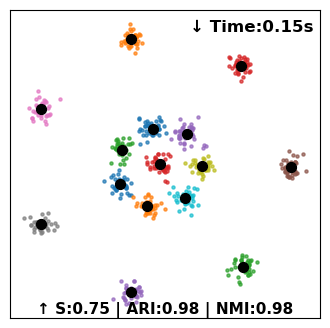

Execution time for Our_eFedG: 0.1485 seconds


In [30]:

device =torch.device("cpu") # torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #


df = pd.read_csv(".datasets/R15.txt", delimiter="\t", header=None)

X = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,:2]
X  = (X  - torch.min(X, dim=0)[0]) / (torch.max(X, dim=0)[0] - torch.min(X, dim=0)[0])
#X = (X - torch.mean(X, dim=0)) / torch.std(X, dim=0)

y = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,2]
y = torch.tensor(y-1, dtype=torch.int64).squeeze()

feature_dim = X.shape[1]
num_classes = 1
num_clusters = 15
batch_size = int(np.ceil(len(y)/num_clients/10))

print("R15",
      f"\n Samples:   {X.shape[0]}",
      f"\n Features:  {feature_dim}",
      f"\n classes:   {num_classes}")

# Model parameters
local_model_params = {
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n": 1,
    "num_sigma": np.sqrt(feature_dim),
    "kappa_join":1/np.sqrt(feature_dim),
    "N_r": num_clusters,
    "c_max": batch_size,
    "kappa_features": 0.0,
    "device": device,
     "thr_relevance": 0.99
}
federated_model_params = local_model_params


if 1:

    metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag= 0, unlabeled=1, name = "R15")



jain 
 Samples:   373 
 Features:  2 
 classes:   1
Eksperiment 1.


C:\Users\Miha\AppData\Local\Temp\ipykernel_7668\1491145748.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(y-1, dtype=torch.int64).squeeze()


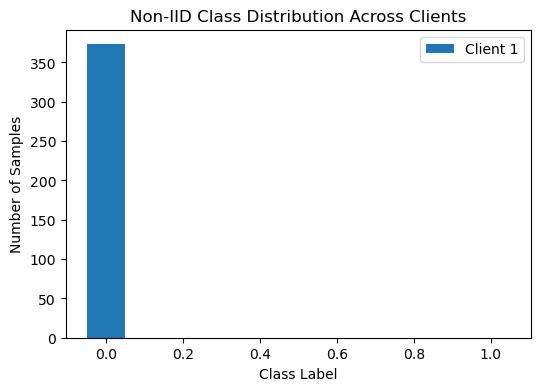



 Our:
Local learning done, transmitting
Local learning done, transmitting
Local learning done, transmitting
Number of clusters in federated model: 10


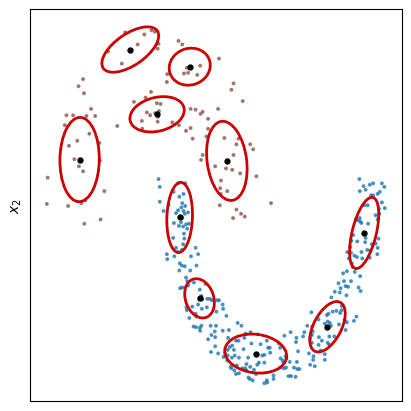

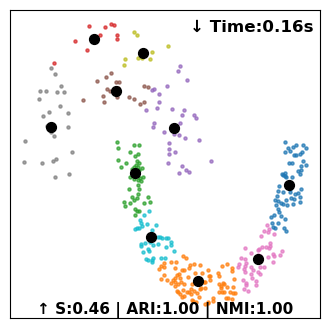

Execution time for Our_eFedG: 0.1555 seconds


In [31]:

device =torch.device("cpu") # torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #


df = pd.read_csv(".datasets/jain.txt", delimiter="\t", header=None)

X = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,0:2]
X  = (X  - torch.min(X, dim=0)[0]) / (torch.max(X, dim=0)[0] - torch.min(X, dim=0)[0])
#X = (X - torch.mean(X, dim=0)) / torch.std(X, dim=0)

y = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,2]
y = torch.tensor(y-1, dtype=torch.int64).squeeze()

feature_dim = X.shape[1]
num_classes = 1
num_clusters = 6
batch_size = int(np.ceil(len(y)/num_clients/10))

print("jain",
      f"\n Samples:   {X.shape[0]}",
      f"\n Features:  {feature_dim}",
      f"\n classes:   {num_classes}")


# Model parameters
local_model_params = {
    "feature_dim": feature_dim,
    "num_classes": num_classes,
    "kappa_n":1,
    "num_sigma": np.sqrt(feature_dim),
    "kappa_join":0.7,
    "N_r": num_clusters,
    "c_max": 0,  
    "kappa_features": 0.0,
    "device": device,
        "thr_relevance": 0.99}

federated_model_params = local_model_params

if 1:

    metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag=0, unlabeled=1, name = "Jain", flag_axis = False, flag_noniid=False)



flame 
 Samples:   240 
 Features:  2 
 classes:   1
Eksperiment 1.


C:\Users\Miha\AppData\Local\Temp\ipykernel_7668\565144603.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(y-1, dtype=torch.int64).squeeze()


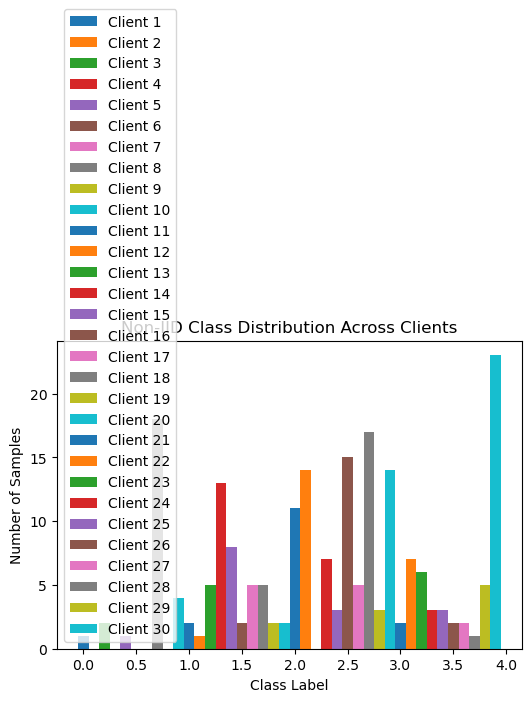



 Our:
Local learning done, transmitting
Local learning done, transmitting
Local learning done, transmitting
Number of clusters in federated model: 4


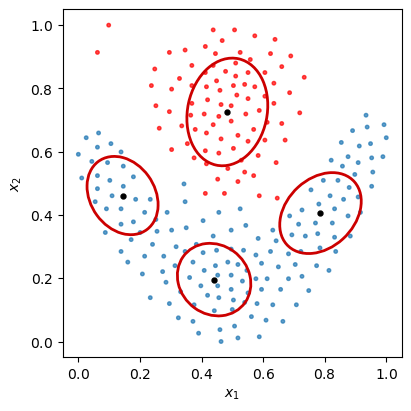

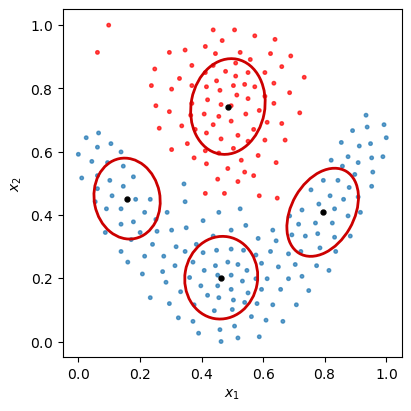

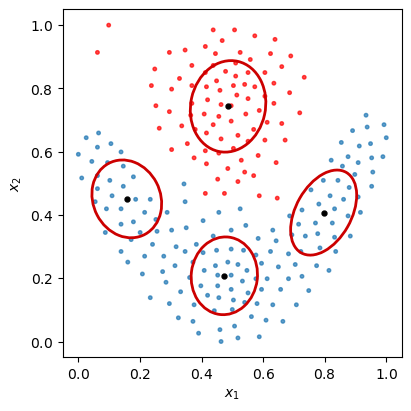

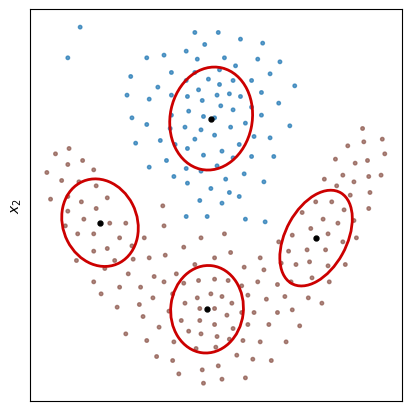

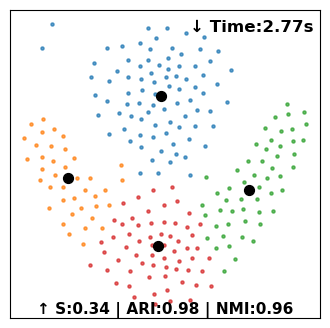

Execution time for Our_eFedG: 2.7730 seconds


In [32]:
if 1:
    device = torch.device("cpu") #torch.device("cuda" if torch.cuda.is_available() else "cpu") #torch.device("cpu") #

    
    df = pd.read_csv(".datasets/flame.txt", delimiter="\t", header=None)

    X = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,0:2]
    X  = (X  - torch.min(X, dim=0)[0]) / (torch.max(X, dim=0)[0] - torch.min(X, dim=0)[0])
    #X = (X - torch.mean(X, dim=0)) / torch.std(X, dim=0)

    y = torch.tensor(pd.get_dummies(df).values, dtype=torch.float32)[:,2]
    y = torch.tensor(y-1, dtype=torch.int64).squeeze()
    
    feature_dim = X.shape[1]
    num_classes = 1
    num_clusters = 3
    num_clients = 30
    batch_size = int(np.ceil(len(y)/num_clients/10))

    print("flame",
        f"\n Samples:   {X.shape[0]}",
        f"\n Features:  {feature_dim}",
        f"\n classes:   {num_classes}")

    # Model parameters
    local_model_params = {
        "feature_dim": feature_dim,
        "num_classes": num_classes,
        "kappa_n": 1,
        "num_sigma": np.sqrt(feature_dim),
        "kappa_join": 0.7,
        "N_r": num_clusters,
        "c_max": batch_size,
        "kappa_features": 0.0,
        "device": device,
        "thr_relevance": 1
    }
    federated_model_params = local_model_params


    if 1:

        metrics = run_benchmark_experiment(X, y, local_model_params, federated_model_params, profiler_flag=False, debug_flag= 1, unlabeled=1, name ="Flame", flag_axis = False, flag_noniid=True)



In [3]:
import os

image_dir = '.Images/related_methods'
files = sorted([f for f in os.listdir(image_dir) if f.endswith('.png')])
datasets = sorted(set(f.split('_')[0] for f in files))
methods = sorted(set(f.split('_', 1)[1].rsplit('.', 1)[0] for f in files if len(f.split('_')) > 1))
print("Datasets:")
for dataset in datasets:
    print(dataset)
print("\nMethods:")
for method in methods:
    print(method)


FileNotFoundError: [WinError 3] The system cannot find the path specified: '.Images/related_methods'

In [ ]:
import os
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# Directory where the images are stored
image_dir = '.Images/related_methods/noniid/'

# Get a list of all PNG files in the directory
files = sorted([f for f in os.listdir(image_dir) if f.endswith('.png')])

# Define the two groups of datasets
datasets_group1 = ['D31', 'R15', 'S1', 'S3', 'Skewed','Unbalance2','Overlap','Aggregation']
datasets_group2 = ['Aggregation', 'Jain', 'Pathbased', 'Spiral']

# Extract unique method names
methods = sorted(set(f.split('_', 1)[1].rsplit('.', 1)[0].replace('_', '-') for f in files if len(f.split('_')) > 1))

# Ensure eFedG is the last method and add "(Our)"
if 'eFedG' in methods:
    methods.remove('eFedG')
methods.append('eFedG (Our)')

# Function to create and save the figure
def create_figure(datasets, output_file):
    # Create a figure with subplots arranged in a grid
    fig = plt.figure(figsize=(len(methods)*2.5, len(datasets)*2.5))  # Adjust figure size for more space

    # Create GridSpec with the first row and first column narrow
    gs = GridSpec(len(datasets)+1, len(methods)+1, figure=fig,
                  width_ratios=[0.15] + [1] * len(methods),  # Increase space for method names
                  height_ratios=[0.15] + [1] * len(datasets))  # Increase space for dataset names

    # Add method names as column headers with a narrow first row
    for j, method in enumerate(methods):
        ax = fig.add_subplot(gs[0, j+1])
        ax.text(0.5, 0.2, method, ha='center', va='center', fontsize=14, fontweight='bold')  # Increased font size and bold
        ax.axis('off')

    # Add dataset names as row labels with a narrow first column
    for i, dataset in enumerate(datasets):
        ax = fig.add_subplot(gs[i+1, 0])
        ax.text(0.2, 0.5, dataset, ha='center', va='center', fontsize=14, fontweight='bold', rotation=90)  # Increased font size and bold
        ax.axis('off')

    # Display the PNG images in the table with no overlapping
    for i, dataset in enumerate(datasets):
        for j, method in enumerate(methods):
            ax = fig.add_subplot(gs[i+1, j+1])
            image_path = os.path.join(image_dir, f"{dataset}_{method.replace(' (Our)', '').replace('-', '_')}.png")
            if os.path.exists(image_path):
                img = plt.imread(image_path)
                ax.imshow(img)
            ax.axis('off')

    # Adjust layout with no overlapping and a bit more space for names
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=-0.1, hspace=0.0)  # Set wspace and hspace to 0.1 for spacing

    # Save the final figure as a PNG
    plt.savefig(output_file, format='png', bbox_inches='tight', dpi=600)

    plt.show()

# Create and save the first figure
create_figure(datasets_group1, ".Images/final_comparison_group1.png")

# Create and save the second figure
create_figure(datasets_group2, ".Images/final_comparison_group2.png")
